# **Deep Convolution Adversarial Networks**

Using two neural networks and matching them against one other (thus the term "adversarial"), generative adversarial networks (GANs) are computational structures that produce new, synthetic instances of data that can be mistaken for actual data. They are extensively employed in the production of voice, video, and images.

GANs are composed of two parts:

--> Generator - creates new instances of data

--> Discriminator: aims to differentiate synthetic or fabricated data from authentic dataset.

By predicting a label or category to which a particular instance of data belongs based on its features, discriminative algorithms attempt to classify input data. Discriminative algorithms thus associate labels with features. That correlation is all that matters to them.Conversely, generative algorithms, to put it loosely, have the opposite effect.They try to anticipate features given a certain label rather than a label given specific features.

They both begin training from scratch together, and throughout the course of the training epochs, the generator learns to shape the random distribution.

In [1]:
import numpy as np 
import pandas as pd 
import os
for dirname, _, filenames in os.walk('/content/Imgs'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/content/Imgs/125658.jpg
/content/Imgs/159399.jpg
/content/Imgs/094127.jpg
/content/Imgs/185834.jpg
/content/Imgs/113796.jpg
/content/Imgs/088988.jpg
/content/Imgs/132945.jpg
/content/Imgs/192537.jpg
/content/Imgs/136243.jpg
/content/Imgs/009737.jpg
/content/Imgs/086279.jpg
/content/Imgs/093820.jpg
/content/Imgs/182255.jpg
/content/Imgs/025141.jpg
/content/Imgs/023238.jpg
/content/Imgs/063436.jpg
/content/Imgs/188608.jpg
/content/Imgs/118465.jpg
/content/Imgs/106338.jpg
/content/Imgs/105890.jpg
/content/Imgs/065956.jpg
/content/Imgs/082434.jpg
/content/Imgs/156762.jpg
/content/Imgs/062121.jpg
/content/Imgs/147063.jpg
/content/Imgs/168161.jpg
/content/Imgs/147148.jpg
/content/Imgs/092803.jpg
/content/Imgs/020601.jpg
/content/Imgs/059826.jpg
/content/Imgs/147516.jpg
/content/Imgs/080215.jpg
/content/Imgs/011735.jpg
/content/Imgs/055134.jpg
/content/Imgs/077942.jpg
/content/Imgs/008503.jpg
/content/Imgs/026210.jpg
/content/Imgs/136668.jpg
/content/Imgs/183720.jpg
/content/Imgs/057467.jpg


/content/Imgs/113115.jpg
/content/Imgs/074541.jpg
/content/Imgs/002261.jpg
/content/Imgs/155651.jpg
/content/Imgs/171062.jpg
/content/Imgs/082735.jpg
/content/Imgs/119485.jpg
/content/Imgs/143194.jpg
/content/Imgs/132527.jpg
/content/Imgs/128782.jpg
/content/Imgs/017326.jpg
/content/Imgs/022939.jpg
/content/Imgs/112632.jpg
/content/Imgs/100590.jpg
/content/Imgs/195422.jpg
/content/Imgs/005653.jpg
/content/Imgs/178506.jpg
/content/Imgs/179030.jpg
/content/Imgs/062543.jpg
/content/Imgs/149377.jpg
/content/Imgs/090075.jpg
/content/Imgs/111457.jpg
/content/Imgs/186663.jpg
/content/Imgs/163031.jpg
/content/Imgs/029221.jpg
/content/Imgs/127880.jpg
/content/Imgs/101034.jpg
/content/Imgs/139987.jpg
/content/Imgs/191144.jpg
/content/Imgs/039837.jpg
/content/Imgs/100733.jpg
/content/Imgs/018956.jpg
/content/Imgs/080676.jpg
/content/Imgs/057717.jpg
/content/Imgs/040248.jpg
/content/Imgs/092125.jpg
/content/Imgs/099711.jpg
/content/Imgs/124100.jpg
/content/Imgs/097083.jpg
/content/Imgs/107130.jpg


/content/Imgs/142757.jpg
/content/Imgs/140818.jpg
/content/Imgs/163904.jpg
/content/Imgs/062248.jpg
/content/Imgs/106856.jpg
/content/Imgs/118310.jpg
/content/Imgs/109533.jpg
/content/Imgs/039435.jpg
/content/Imgs/167539.jpg
/content/Imgs/024883.jpg
/content/Imgs/113895.jpg
/content/Imgs/164212.jpg
/content/Imgs/085576.jpg
/content/Imgs/081676.jpg
/content/Imgs/156252.jpg
/content/Imgs/177254.jpg
/content/Imgs/164310.jpg
/content/Imgs/040626.jpg
/content/Imgs/021841.jpg
/content/Imgs/122498.jpg
/content/Imgs/091182.jpg
/content/Imgs/088989.jpg
/content/Imgs/049695.jpg
/content/Imgs/125959.jpg
/content/Imgs/106855.jpg
/content/Imgs/047350.jpg
/content/Imgs/076409.jpg
/content/Imgs/125653.jpg
/content/Imgs/135378.jpg
/content/Imgs/067982.jpg
/content/Imgs/018059.jpg
/content/Imgs/001865.jpg
/content/Imgs/110934.jpg
/content/Imgs/014552.jpg
/content/Imgs/029383.jpg
/content/Imgs/145878.jpg
/content/Imgs/007682.jpg
/content/Imgs/101805.jpg
/content/Imgs/024352.jpg
/content/Imgs/010390.jpg


/content/Imgs/079910.jpg
/content/Imgs/009608.jpg
/content/Imgs/129298.jpg
/content/Imgs/192598.jpg
/content/Imgs/043075.jpg
/content/Imgs/134802.jpg
/content/Imgs/083921.jpg
/content/Imgs/130074.jpg
/content/Imgs/132974.jpg
/content/Imgs/187732.jpg
/content/Imgs/111561.jpg
/content/Imgs/167869.jpg
/content/Imgs/075574.jpg
/content/Imgs/033526.jpg
/content/Imgs/009202.jpg
/content/Imgs/167533.jpg
/content/Imgs/020221.jpg
/content/Imgs/124795.jpg
/content/Imgs/176901.jpg
/content/Imgs/188294.jpg
/content/Imgs/200528.jpg
/content/Imgs/142547.jpg
/content/Imgs/181136.jpg
/content/Imgs/167538.jpg
/content/Imgs/051203.jpg
/content/Imgs/011030.jpg
/content/Imgs/038539.jpg
/content/Imgs/111839.jpg
/content/Imgs/139366.jpg
/content/Imgs/197532.jpg
/content/Imgs/142471.jpg
/content/Imgs/001528.jpg
/content/Imgs/111288.jpg
/content/Imgs/072357.jpg
/content/Imgs/069347.jpg
/content/Imgs/186231.jpg
/content/Imgs/077655.jpg
/content/Imgs/100250.jpg
/content/Imgs/120649.jpg
/content/Imgs/178552.jpg


/content/Imgs/193380.jpg
/content/Imgs/122066.jpg
/content/Imgs/002077.jpg
/content/Imgs/122161.jpg
/content/Imgs/201307.jpg
/content/Imgs/193384.jpg
/content/Imgs/120950.jpg
/content/Imgs/045068.jpg
/content/Imgs/158632.jpg
/content/Imgs/019871.jpg
/content/Imgs/166942.jpg
/content/Imgs/050477.jpg
/content/Imgs/098223.jpg
/content/Imgs/053607.jpg
/content/Imgs/061726.jpg
/content/Imgs/140159.jpg
/content/Imgs/063521.jpg
/content/Imgs/126467.jpg
/content/Imgs/194724.jpg
/content/Imgs/081956.jpg
/content/Imgs/113401.jpg
/content/Imgs/185977.jpg
/content/Imgs/113917.jpg
/content/Imgs/113664.jpg
/content/Imgs/043642.jpg
/content/Imgs/107777.jpg
/content/Imgs/109545.jpg
/content/Imgs/011205.jpg
/content/Imgs/106220.jpg
/content/Imgs/178652.jpg
/content/Imgs/098761.jpg
/content/Imgs/174343.jpg
/content/Imgs/117204.jpg
/content/Imgs/050640.jpg
/content/Imgs/170840.jpg
/content/Imgs/111217.jpg
/content/Imgs/012327.jpg
/content/Imgs/088928.jpg
/content/Imgs/137360.jpg
/content/Imgs/117850.jpg


/content/Imgs/042042.jpg
/content/Imgs/153107.jpg
/content/Imgs/010904.jpg
/content/Imgs/102042.jpg
/content/Imgs/197502.jpg
/content/Imgs/180694.jpg
/content/Imgs/077904.jpg
/content/Imgs/091938.jpg
/content/Imgs/115829.jpg
/content/Imgs/157223.jpg
/content/Imgs/080680.jpg
/content/Imgs/086006.jpg
/content/Imgs/110179.jpg
/content/Imgs/155304.jpg
/content/Imgs/010104.jpg
/content/Imgs/091655.jpg
/content/Imgs/000089.jpg
/content/Imgs/034621.jpg
/content/Imgs/112416.jpg
/content/Imgs/187048.jpg
/content/Imgs/106184.jpg
/content/Imgs/024020.jpg
/content/Imgs/196795.jpg
/content/Imgs/096394.jpg
/content/Imgs/033644.jpg
/content/Imgs/074682.jpg
/content/Imgs/190143.jpg
/content/Imgs/002213.jpg
/content/Imgs/099084.jpg
/content/Imgs/128054.jpg
/content/Imgs/140434.jpg
/content/Imgs/034736.jpg
/content/Imgs/153574.jpg
/content/Imgs/020646.jpg
/content/Imgs/003025.jpg
/content/Imgs/193415.jpg
/content/Imgs/071466.jpg
/content/Imgs/006266.jpg
/content/Imgs/121355.jpg
/content/Imgs/096209.jpg


/content/Imgs/149152.jpg
/content/Imgs/153896.jpg
/content/Imgs/048046.jpg
/content/Imgs/087780.jpg
/content/Imgs/058346.jpg
/content/Imgs/055705.jpg
/content/Imgs/066835.jpg
/content/Imgs/189748.jpg
/content/Imgs/033402.jpg
/content/Imgs/034679.jpg
/content/Imgs/104422.jpg
/content/Imgs/006393.jpg
/content/Imgs/178918.jpg
/content/Imgs/093824.jpg
/content/Imgs/166914.jpg
/content/Imgs/091633.jpg
/content/Imgs/016301.jpg
/content/Imgs/122180.jpg
/content/Imgs/141224.jpg
/content/Imgs/032343.jpg
/content/Imgs/123218.jpg
/content/Imgs/141136.jpg
/content/Imgs/044810.jpg
/content/Imgs/010477.jpg
/content/Imgs/005149.jpg
/content/Imgs/137033.jpg
/content/Imgs/085453.jpg
/content/Imgs/054691.jpg
/content/Imgs/128866.jpg
/content/Imgs/100845.jpg
/content/Imgs/092537.jpg
/content/Imgs/201993.jpg
/content/Imgs/161668.jpg
/content/Imgs/167603.jpg
/content/Imgs/192222.jpg
/content/Imgs/129314.jpg
/content/Imgs/015885.jpg
/content/Imgs/178086.jpg
/content/Imgs/195141.jpg
/content/Imgs/030189.jpg


/content/Imgs/030217.jpg
/content/Imgs/030558.jpg
/content/Imgs/104095.jpg
/content/Imgs/137365.jpg
/content/Imgs/168489.jpg
/content/Imgs/161825.jpg
/content/Imgs/135272.jpg
/content/Imgs/138503.jpg
/content/Imgs/132756.jpg
/content/Imgs/126203.jpg
/content/Imgs/177045.jpg
/content/Imgs/187538.jpg
/content/Imgs/129010.jpg
/content/Imgs/156831.jpg
/content/Imgs/093015.jpg
/content/Imgs/017030.jpg
/content/Imgs/136131.jpg
/content/Imgs/174693.jpg
/content/Imgs/086545.jpg
/content/Imgs/056745.jpg
/content/Imgs/018661.jpg
/content/Imgs/035980.jpg
/content/Imgs/156641.jpg
/content/Imgs/087429.jpg
/content/Imgs/096581.jpg
/content/Imgs/023847.jpg
/content/Imgs/035240.jpg
/content/Imgs/092879.jpg
/content/Imgs/102099.jpg
/content/Imgs/180623.jpg
/content/Imgs/032017.jpg
/content/Imgs/015971.jpg
/content/Imgs/007247.jpg
/content/Imgs/180735.jpg
/content/Imgs/006066.jpg
/content/Imgs/171262.jpg
/content/Imgs/112538.jpg
/content/Imgs/083734.jpg
/content/Imgs/194999.jpg
/content/Imgs/090304.jpg


/content/Imgs/159116.jpg
/content/Imgs/100914.jpg
/content/Imgs/012537.jpg
/content/Imgs/087006.jpg
/content/Imgs/181449.jpg
/content/Imgs/187284.jpg
/content/Imgs/052008.jpg
/content/Imgs/152781.jpg
/content/Imgs/124397.jpg
/content/Imgs/112401.jpg
/content/Imgs/126113.jpg
/content/Imgs/094854.jpg
/content/Imgs/079010.jpg
/content/Imgs/117842.jpg
/content/Imgs/125657.jpg
/content/Imgs/080064.jpg
/content/Imgs/182131.jpg
/content/Imgs/129981.jpg
/content/Imgs/132549.jpg
/content/Imgs/003293.jpg
/content/Imgs/092358.jpg
/content/Imgs/110636.jpg
/content/Imgs/172206.jpg
/content/Imgs/013810.jpg
/content/Imgs/160390.jpg
/content/Imgs/190427.jpg
/content/Imgs/086988.jpg
/content/Imgs/012960.jpg
/content/Imgs/093918.jpg
/content/Imgs/144036.jpg
/content/Imgs/167451.jpg
/content/Imgs/035909.jpg
/content/Imgs/188678.jpg
/content/Imgs/198032.jpg
/content/Imgs/061093.jpg
/content/Imgs/004695.jpg
/content/Imgs/196219.jpg
/content/Imgs/167008.jpg
/content/Imgs/133833.jpg
/content/Imgs/201605.jpg


/content/Imgs/173090.jpg
/content/Imgs/155179.jpg
/content/Imgs/008007.jpg
/content/Imgs/142462.jpg
/content/Imgs/181334.jpg
/content/Imgs/166339.jpg
/content/Imgs/020643.jpg
/content/Imgs/078847.jpg
/content/Imgs/160413.jpg
/content/Imgs/046304.jpg
/content/Imgs/096689.jpg
/content/Imgs/032780.jpg
/content/Imgs/111258.jpg
/content/Imgs/189189.jpg
/content/Imgs/036214.jpg
/content/Imgs/101605.jpg
/content/Imgs/054028.jpg
/content/Imgs/044853.jpg
/content/Imgs/055649.jpg
/content/Imgs/188174.jpg
/content/Imgs/073772.jpg
/content/Imgs/124119.jpg
/content/Imgs/065926.jpg
/content/Imgs/059583.jpg
/content/Imgs/053133.jpg
/content/Imgs/199521.jpg
/content/Imgs/095871.jpg
/content/Imgs/164849.jpg
/content/Imgs/162407.jpg
/content/Imgs/039011.jpg
/content/Imgs/165689.jpg
/content/Imgs/036247.jpg
/content/Imgs/154470.jpg
/content/Imgs/019005.jpg
/content/Imgs/038376.jpg
/content/Imgs/008141.jpg
/content/Imgs/109698.jpg
/content/Imgs/006385.jpg
/content/Imgs/166414.jpg
/content/Imgs/063344.jpg


/content/Imgs/033658.jpg
/content/Imgs/097746.jpg
/content/Imgs/008957.jpg
/content/Imgs/139139.jpg
/content/Imgs/175647.jpg
/content/Imgs/125265.jpg
/content/Imgs/014185.jpg
/content/Imgs/142746.jpg
/content/Imgs/035512.jpg
/content/Imgs/181843.jpg
/content/Imgs/075933.jpg
/content/Imgs/011137.jpg
/content/Imgs/020263.jpg
/content/Imgs/139931.jpg
/content/Imgs/170197.jpg
/content/Imgs/039678.jpg
/content/Imgs/053553.jpg
/content/Imgs/177110.jpg
/content/Imgs/000528.jpg
/content/Imgs/129828.jpg
/content/Imgs/084929.jpg
/content/Imgs/023191.jpg
/content/Imgs/071478.jpg
/content/Imgs/100781.jpg
/content/Imgs/127259.jpg
/content/Imgs/137571.jpg
/content/Imgs/111527.jpg
/content/Imgs/062907.jpg
/content/Imgs/145940.jpg
/content/Imgs/031649.jpg
/content/Imgs/044977.jpg
/content/Imgs/013602.jpg
/content/Imgs/125637.jpg
/content/Imgs/199287.jpg
/content/Imgs/026771.jpg
/content/Imgs/062965.jpg
/content/Imgs/002452.jpg
/content/Imgs/160195.jpg
/content/Imgs/190806.jpg
/content/Imgs/063392.jpg


/content/Imgs/140886.jpg
/content/Imgs/090974.jpg
/content/Imgs/075241.jpg
/content/Imgs/161767.jpg
/content/Imgs/052695.jpg
/content/Imgs/133628.jpg
/content/Imgs/124814.jpg
/content/Imgs/093826.jpg
/content/Imgs/138932.jpg
/content/Imgs/029014.jpg
/content/Imgs/122091.jpg
/content/Imgs/144723.jpg
/content/Imgs/079215.jpg
/content/Imgs/113231.jpg
/content/Imgs/162154.jpg
/content/Imgs/136199.jpg
/content/Imgs/180588.jpg
/content/Imgs/070714.jpg
/content/Imgs/118395.jpg
/content/Imgs/008191.jpg
/content/Imgs/181845.jpg
/content/Imgs/033696.jpg
/content/Imgs/086275.jpg
/content/Imgs/004381.jpg
/content/Imgs/053977.jpg
/content/Imgs/148653.jpg
/content/Imgs/089932.jpg
/content/Imgs/118335.jpg
/content/Imgs/075962.jpg
/content/Imgs/073101.jpg
/content/Imgs/121836.jpg
/content/Imgs/000509.jpg
/content/Imgs/050408.jpg
/content/Imgs/120142.jpg
/content/Imgs/115339.jpg
/content/Imgs/037143.jpg
/content/Imgs/181893.jpg
/content/Imgs/015009.jpg
/content/Imgs/124945.jpg
/content/Imgs/058359.jpg


/content/Imgs/001397.jpg
/content/Imgs/000523.jpg
/content/Imgs/042981.jpg
/content/Imgs/153662.jpg
/content/Imgs/043185.jpg
/content/Imgs/124402.jpg
/content/Imgs/095319.jpg
/content/Imgs/191590.jpg
/content/Imgs/132988.jpg
/content/Imgs/178266.jpg
/content/Imgs/138402.jpg
/content/Imgs/051721.jpg
/content/Imgs/011214.jpg
/content/Imgs/135561.jpg
/content/Imgs/184408.jpg
/content/Imgs/115945.jpg
/content/Imgs/182840.jpg
/content/Imgs/116900.jpg
/content/Imgs/095588.jpg
/content/Imgs/049125.jpg
/content/Imgs/004655.jpg
/content/Imgs/144560.jpg
/content/Imgs/186394.jpg
/content/Imgs/167578.jpg
/content/Imgs/008293.jpg
/content/Imgs/200444.jpg
/content/Imgs/005027.jpg
/content/Imgs/165652.jpg
/content/Imgs/067141.jpg
/content/Imgs/184001.jpg
/content/Imgs/165136.jpg
/content/Imgs/033036.jpg
/content/Imgs/079988.jpg
/content/Imgs/021129.jpg
/content/Imgs/017486.jpg
/content/Imgs/142562.jpg
/content/Imgs/157597.jpg
/content/Imgs/088070.jpg
/content/Imgs/156145.jpg
/content/Imgs/131085.jpg


/content/Imgs/065187.jpg
/content/Imgs/165158.jpg
/content/Imgs/201054.jpg
/content/Imgs/130423.jpg
/content/Imgs/049650.jpg
/content/Imgs/098812.jpg
/content/Imgs/167558.jpg
/content/Imgs/104028.jpg
/content/Imgs/071479.jpg
/content/Imgs/184884.jpg
/content/Imgs/021043.jpg
/content/Imgs/060860.jpg
/content/Imgs/030745.jpg
/content/Imgs/051657.jpg
/content/Imgs/115928.jpg
/content/Imgs/180487.jpg
/content/Imgs/046713.jpg
/content/Imgs/071537.jpg
/content/Imgs/166903.jpg
/content/Imgs/013655.jpg
/content/Imgs/136440.jpg
/content/Imgs/196304.jpg
/content/Imgs/074712.jpg
/content/Imgs/000071.jpg
/content/Imgs/049095.jpg
/content/Imgs/124921.jpg
/content/Imgs/196299.jpg
/content/Imgs/131505.jpg
/content/Imgs/050370.jpg
/content/Imgs/164817.jpg
/content/Imgs/196791.jpg
/content/Imgs/103059.jpg
/content/Imgs/030366.jpg
/content/Imgs/022709.jpg
/content/Imgs/046577.jpg
/content/Imgs/005266.jpg
/content/Imgs/082063.jpg
/content/Imgs/095779.jpg
/content/Imgs/115767.jpg
/content/Imgs/086113.jpg


/content/Imgs/145385.jpg
/content/Imgs/135699.jpg
/content/Imgs/200423.jpg
/content/Imgs/049783.jpg
/content/Imgs/128915.jpg
/content/Imgs/095048.jpg
/content/Imgs/168008.jpg
/content/Imgs/084088.jpg
/content/Imgs/154874.jpg
/content/Imgs/162114.jpg
/content/Imgs/075608.jpg
/content/Imgs/087589.jpg
/content/Imgs/103837.jpg
/content/Imgs/136144.jpg
/content/Imgs/027575.jpg
/content/Imgs/036224.jpg
/content/Imgs/021430.jpg
/content/Imgs/120802.jpg
/content/Imgs/102250.jpg
/content/Imgs/137355.jpg
/content/Imgs/156460.jpg
/content/Imgs/128927.jpg
/content/Imgs/143916.jpg
/content/Imgs/040131.jpg
/content/Imgs/096145.jpg
/content/Imgs/110920.jpg
/content/Imgs/042620.jpg
/content/Imgs/176916.jpg
/content/Imgs/024408.jpg
/content/Imgs/166578.jpg
/content/Imgs/047799.jpg
/content/Imgs/023185.jpg
/content/Imgs/157090.jpg
/content/Imgs/030866.jpg
/content/Imgs/177594.jpg
/content/Imgs/043069.jpg
/content/Imgs/170571.jpg
/content/Imgs/154862.jpg
/content/Imgs/136554.jpg
/content/Imgs/190456.jpg


/content/Imgs/027985.jpg
/content/Imgs/165297.jpg
/content/Imgs/001939.jpg
/content/Imgs/136870.jpg
/content/Imgs/197107.jpg
/content/Imgs/106503.jpg
/content/Imgs/180230.jpg
/content/Imgs/139163.jpg
/content/Imgs/163259.jpg
/content/Imgs/051818.jpg
/content/Imgs/008437.jpg
/content/Imgs/188051.jpg
/content/Imgs/154230.jpg
/content/Imgs/053361.jpg
/content/Imgs/139740.jpg
/content/Imgs/149653.jpg
/content/Imgs/172722.jpg
/content/Imgs/062940.jpg
/content/Imgs/029912.jpg
/content/Imgs/150693.jpg
/content/Imgs/100099.jpg
/content/Imgs/098301.jpg
/content/Imgs/118816.jpg
/content/Imgs/079427.jpg
/content/Imgs/153754.jpg
/content/Imgs/010505.jpg
/content/Imgs/085979.jpg
/content/Imgs/092905.jpg
/content/Imgs/087049.jpg
/content/Imgs/048701.jpg
/content/Imgs/131989.jpg
/content/Imgs/098224.jpg
/content/Imgs/038822.jpg
/content/Imgs/179957.jpg
/content/Imgs/023052.jpg
/content/Imgs/084241.jpg
/content/Imgs/171289.jpg
/content/Imgs/147898.jpg
/content/Imgs/099771.jpg
/content/Imgs/018975.jpg


/content/Imgs/018510.jpg
/content/Imgs/115222.jpg
/content/Imgs/098196.jpg
/content/Imgs/161839.jpg
/content/Imgs/193702.jpg
/content/Imgs/084041.jpg
/content/Imgs/088510.jpg
/content/Imgs/153349.jpg
/content/Imgs/163945.jpg
/content/Imgs/199680.jpg
/content/Imgs/088374.jpg
/content/Imgs/163469.jpg
/content/Imgs/070016.jpg
/content/Imgs/116836.jpg
/content/Imgs/070170.jpg
/content/Imgs/068318.jpg
/content/Imgs/147043.jpg
/content/Imgs/030895.jpg
/content/Imgs/061483.jpg
/content/Imgs/191360.jpg
/content/Imgs/180502.jpg
/content/Imgs/128272.jpg
/content/Imgs/053232.jpg
/content/Imgs/093530.jpg
/content/Imgs/038472.jpg
/content/Imgs/029301.jpg
/content/Imgs/011266.jpg
/content/Imgs/172150.jpg
/content/Imgs/146548.jpg
/content/Imgs/058534.jpg
/content/Imgs/023948.jpg
/content/Imgs/030011.jpg
/content/Imgs/078472.jpg
/content/Imgs/132874.jpg
/content/Imgs/180560.jpg
/content/Imgs/088469.jpg
/content/Imgs/024573.jpg
/content/Imgs/110991.jpg
/content/Imgs/020843.jpg
/content/Imgs/132399.jpg


/content/Imgs/065160.jpg
/content/Imgs/023049.jpg
/content/Imgs/014391.jpg
/content/Imgs/153694.jpg
/content/Imgs/146910.jpg
/content/Imgs/007156.jpg
/content/Imgs/107227.jpg
/content/Imgs/049375.jpg
/content/Imgs/169910.jpg
/content/Imgs/104033.jpg
/content/Imgs/153718.jpg
/content/Imgs/154670.jpg
/content/Imgs/148271.jpg
/content/Imgs/007359.jpg
/content/Imgs/123733.jpg
/content/Imgs/089827.jpg
/content/Imgs/003190.jpg
/content/Imgs/169304.jpg
/content/Imgs/140866.jpg
/content/Imgs/026222.jpg
/content/Imgs/052062.jpg
/content/Imgs/054235.jpg
/content/Imgs/088566.jpg
/content/Imgs/036016.jpg
/content/Imgs/092097.jpg
/content/Imgs/153609.jpg
/content/Imgs/165890.jpg
/content/Imgs/102968.jpg
/content/Imgs/127845.jpg
/content/Imgs/082015.jpg
/content/Imgs/067520.jpg
/content/Imgs/171975.jpg
/content/Imgs/166802.jpg
/content/Imgs/154573.jpg
/content/Imgs/024474.jpg
/content/Imgs/137605.jpg
/content/Imgs/142794.jpg
/content/Imgs/113117.jpg
/content/Imgs/021525.jpg
/content/Imgs/124229.jpg


/content/Imgs/142630.jpg
/content/Imgs/130103.jpg
/content/Imgs/149533.jpg
/content/Imgs/071669.jpg
/content/Imgs/141043.jpg
/content/Imgs/184796.jpg
/content/Imgs/050683.jpg
/content/Imgs/169538.jpg
/content/Imgs/019285.jpg
/content/Imgs/041199.jpg
/content/Imgs/111592.jpg
/content/Imgs/049601.jpg
/content/Imgs/130978.jpg
/content/Imgs/161389.jpg
/content/Imgs/163344.jpg
/content/Imgs/005828.jpg
/content/Imgs/134022.jpg
/content/Imgs/047100.jpg
/content/Imgs/077613.jpg
/content/Imgs/148658.jpg
/content/Imgs/152020.jpg
/content/Imgs/071566.jpg
/content/Imgs/123669.jpg
/content/Imgs/035438.jpg
/content/Imgs/075402.jpg
/content/Imgs/071945.jpg
/content/Imgs/041616.jpg
/content/Imgs/052185.jpg
/content/Imgs/046287.jpg
/content/Imgs/046508.jpg
/content/Imgs/130739.jpg
/content/Imgs/121513.jpg
/content/Imgs/078238.jpg
/content/Imgs/034831.jpg
/content/Imgs/176655.jpg
/content/Imgs/191934.jpg
/content/Imgs/135615.jpg
/content/Imgs/069008.jpg
/content/Imgs/078794.jpg
/content/Imgs/007418.jpg


/content/Imgs/138178.jpg
/content/Imgs/064186.jpg
/content/Imgs/178823.jpg
/content/Imgs/088003.jpg
/content/Imgs/196835.jpg
/content/Imgs/040428.jpg
/content/Imgs/162831.jpg
/content/Imgs/045294.jpg
/content/Imgs/139956.jpg
/content/Imgs/168676.jpg
/content/Imgs/187015.jpg
/content/Imgs/168596.jpg
/content/Imgs/109652.jpg
/content/Imgs/057333.jpg
/content/Imgs/172113.jpg
/content/Imgs/151737.jpg
/content/Imgs/089704.jpg
/content/Imgs/112918.jpg
/content/Imgs/102598.jpg
/content/Imgs/166586.jpg
/content/Imgs/058699.jpg
/content/Imgs/163106.jpg
/content/Imgs/181907.jpg
/content/Imgs/121315.jpg
/content/Imgs/191065.jpg
/content/Imgs/173590.jpg
/content/Imgs/098709.jpg
/content/Imgs/092551.jpg
/content/Imgs/019274.jpg
/content/Imgs/178493.jpg
/content/Imgs/169352.jpg
/content/Imgs/092670.jpg
/content/Imgs/195739.jpg
/content/Imgs/079402.jpg
/content/Imgs/126817.jpg
/content/Imgs/190065.jpg
/content/Imgs/093518.jpg
/content/Imgs/146516.jpg
/content/Imgs/162164.jpg
/content/Imgs/107716.jpg


/content/Imgs/043552.jpg
/content/Imgs/032836.jpg
/content/Imgs/172221.jpg
/content/Imgs/089382.jpg
/content/Imgs/158934.jpg
/content/Imgs/046555.jpg
/content/Imgs/068997.jpg
/content/Imgs/108026.jpg
/content/Imgs/030337.jpg
/content/Imgs/054606.jpg
/content/Imgs/101796.jpg
/content/Imgs/064899.jpg
/content/Imgs/042948.jpg
/content/Imgs/145851.jpg
/content/Imgs/169706.jpg
/content/Imgs/162132.jpg
/content/Imgs/162008.jpg
/content/Imgs/154628.jpg
/content/Imgs/037337.jpg
/content/Imgs/069477.jpg
/content/Imgs/161689.jpg
/content/Imgs/060517.jpg
/content/Imgs/023105.jpg
/content/Imgs/149885.jpg
/content/Imgs/027770.jpg
/content/Imgs/162963.jpg
/content/Imgs/104237.jpg
/content/Imgs/194681.jpg
/content/Imgs/134481.jpg
/content/Imgs/105205.jpg
/content/Imgs/165716.jpg
/content/Imgs/003900.jpg
/content/Imgs/063054.jpg
/content/Imgs/052174.jpg
/content/Imgs/118499.jpg
/content/Imgs/116183.jpg
/content/Imgs/059138.jpg
/content/Imgs/018907.jpg
/content/Imgs/167090.jpg
/content/Imgs/178462.jpg


/content/Imgs/023761.jpg
/content/Imgs/060142.jpg
/content/Imgs/127184.jpg
/content/Imgs/126826.jpg
/content/Imgs/115990.jpg
/content/Imgs/029673.jpg
/content/Imgs/098571.jpg
/content/Imgs/137660.jpg
/content/Imgs/144886.jpg
/content/Imgs/024882.jpg
/content/Imgs/185452.jpg
/content/Imgs/000315.jpg
/content/Imgs/132955.jpg
/content/Imgs/161179.jpg
/content/Imgs/016159.jpg
/content/Imgs/090496.jpg
/content/Imgs/104635.jpg
/content/Imgs/019278.jpg
/content/Imgs/027907.jpg
/content/Imgs/009648.jpg
/content/Imgs/005070.jpg
/content/Imgs/173430.jpg
/content/Imgs/159102.jpg
/content/Imgs/107950.jpg
/content/Imgs/076327.jpg
/content/Imgs/170190.jpg
/content/Imgs/135165.jpg
/content/Imgs/095792.jpg
/content/Imgs/155140.jpg
/content/Imgs/058442.jpg
/content/Imgs/150601.jpg
/content/Imgs/196342.jpg
/content/Imgs/173783.jpg
/content/Imgs/065001.jpg
/content/Imgs/176793.jpg
/content/Imgs/180098.jpg
/content/Imgs/180431.jpg
/content/Imgs/067994.jpg
/content/Imgs/179726.jpg
/content/Imgs/008637.jpg


/content/Imgs/007731.jpg
/content/Imgs/106579.jpg
/content/Imgs/181227.jpg
/content/Imgs/170187.jpg
/content/Imgs/072505.jpg
/content/Imgs/120293.jpg
/content/Imgs/092727.jpg
/content/Imgs/004574.jpg
/content/Imgs/084730.jpg
/content/Imgs/064466.jpg
/content/Imgs/104562.jpg
/content/Imgs/106449.jpg
/content/Imgs/089692.jpg
/content/Imgs/083347.jpg
/content/Imgs/199435.jpg
/content/Imgs/088630.jpg
/content/Imgs/003004.jpg
/content/Imgs/027922.jpg
/content/Imgs/180519.jpg
/content/Imgs/201776.jpg
/content/Imgs/173915.jpg
/content/Imgs/059993.jpg
/content/Imgs/121058.jpg
/content/Imgs/202475.jpg
/content/Imgs/017084.jpg
/content/Imgs/120555.jpg
/content/Imgs/124735.jpg
/content/Imgs/137924.jpg
/content/Imgs/085891.jpg
/content/Imgs/198485.jpg
/content/Imgs/068830.jpg
/content/Imgs/075858.jpg
/content/Imgs/196623.jpg
/content/Imgs/065946.jpg
/content/Imgs/120579.jpg
/content/Imgs/043163.jpg
/content/Imgs/157492.jpg
/content/Imgs/064820.jpg
/content/Imgs/201180.jpg
/content/Imgs/069588.jpg


/content/Imgs/189310.jpg
/content/Imgs/185139.jpg
/content/Imgs/163129.jpg
/content/Imgs/190538.jpg
/content/Imgs/109508.jpg
/content/Imgs/170095.jpg
/content/Imgs/031235.jpg
/content/Imgs/127105.jpg
/content/Imgs/096585.jpg
/content/Imgs/011209.jpg
/content/Imgs/074419.jpg
/content/Imgs/010422.jpg
/content/Imgs/122391.jpg
/content/Imgs/016590.jpg
/content/Imgs/054773.jpg
/content/Imgs/039009.jpg
/content/Imgs/008699.jpg
/content/Imgs/056870.jpg
/content/Imgs/089773.jpg
/content/Imgs/108929.jpg
/content/Imgs/086800.jpg
/content/Imgs/033768.jpg
/content/Imgs/030370.jpg
/content/Imgs/179055.jpg
/content/Imgs/095844.jpg
/content/Imgs/097801.jpg
/content/Imgs/026256.jpg
/content/Imgs/158637.jpg
/content/Imgs/012754.jpg
/content/Imgs/012903.jpg
/content/Imgs/125316.jpg
/content/Imgs/124575.jpg
/content/Imgs/021177.jpg
/content/Imgs/179490.jpg
/content/Imgs/165843.jpg
/content/Imgs/116336.jpg
/content/Imgs/047777.jpg
/content/Imgs/087437.jpg
/content/Imgs/144051.jpg
/content/Imgs/114549.jpg


/content/Imgs/177993.jpg
/content/Imgs/131741.jpg
/content/Imgs/166549.jpg
/content/Imgs/092893.jpg
/content/Imgs/062104.jpg
/content/Imgs/172241.jpg
/content/Imgs/163247.jpg
/content/Imgs/163529.jpg
/content/Imgs/128640.jpg
/content/Imgs/195401.jpg
/content/Imgs/129292.jpg
/content/Imgs/095771.jpg
/content/Imgs/033628.jpg
/content/Imgs/171376.jpg
/content/Imgs/078466.jpg
/content/Imgs/110632.jpg
/content/Imgs/179352.jpg
/content/Imgs/036158.jpg
/content/Imgs/152841.jpg
/content/Imgs/075769.jpg
/content/Imgs/108411.jpg
/content/Imgs/160980.jpg
/content/Imgs/003111.jpg
/content/Imgs/087759.jpg
/content/Imgs/104379.jpg
/content/Imgs/156477.jpg
/content/Imgs/081201.jpg
/content/Imgs/047242.jpg
/content/Imgs/084583.jpg
/content/Imgs/187526.jpg
/content/Imgs/089174.jpg
/content/Imgs/098035.jpg
/content/Imgs/097905.jpg
/content/Imgs/026719.jpg
/content/Imgs/117839.jpg
/content/Imgs/054940.jpg
/content/Imgs/148817.jpg
/content/Imgs/095522.jpg
/content/Imgs/101861.jpg
/content/Imgs/014501.jpg


/content/Imgs/077218.jpg
/content/Imgs/037502.jpg
/content/Imgs/066020.jpg
/content/Imgs/185098.jpg
/content/Imgs/046394.jpg
/content/Imgs/171695.jpg
/content/Imgs/012892.jpg
/content/Imgs/187051.jpg
/content/Imgs/089651.jpg
/content/Imgs/053313.jpg
/content/Imgs/120922.jpg
/content/Imgs/088724.jpg
/content/Imgs/168280.jpg
/content/Imgs/156193.jpg
/content/Imgs/191201.jpg
/content/Imgs/106410.jpg
/content/Imgs/158685.jpg
/content/Imgs/108554.jpg
/content/Imgs/071939.jpg
/content/Imgs/090288.jpg
/content/Imgs/041314.jpg
/content/Imgs/109936.jpg
/content/Imgs/152478.jpg
/content/Imgs/033246.jpg
/content/Imgs/054092.jpg
/content/Imgs/172255.jpg
/content/Imgs/188668.jpg
/content/Imgs/095737.jpg
/content/Imgs/194071.jpg
/content/Imgs/033549.jpg
/content/Imgs/029938.jpg
/content/Imgs/029162.jpg
/content/Imgs/154489.jpg
/content/Imgs/007003.jpg
/content/Imgs/090218.jpg
/content/Imgs/146497.jpg
/content/Imgs/095803.jpg
/content/Imgs/025930.jpg
/content/Imgs/163632.jpg
/content/Imgs/138522.jpg


/content/Imgs/001635.jpg
/content/Imgs/002566.jpg
/content/Imgs/048302.jpg
/content/Imgs/048329.jpg
/content/Imgs/067670.jpg
/content/Imgs/126512.jpg
/content/Imgs/134658.jpg
/content/Imgs/064078.jpg
/content/Imgs/048137.jpg
/content/Imgs/172108.jpg
/content/Imgs/193614.jpg
/content/Imgs/159619.jpg
/content/Imgs/127031.jpg
/content/Imgs/115629.jpg
/content/Imgs/189045.jpg
/content/Imgs/127231.jpg
/content/Imgs/059750.jpg
/content/Imgs/105257.jpg
/content/Imgs/132400.jpg
/content/Imgs/165387.jpg
/content/Imgs/103616.jpg
/content/Imgs/154064.jpg
/content/Imgs/051570.jpg
/content/Imgs/070528.jpg
/content/Imgs/126190.jpg
/content/Imgs/046270.jpg
/content/Imgs/155788.jpg
/content/Imgs/121168.jpg
/content/Imgs/064997.jpg
/content/Imgs/153988.jpg
/content/Imgs/004566.jpg
/content/Imgs/000172.jpg
/content/Imgs/000331.jpg
/content/Imgs/101435.jpg
/content/Imgs/192149.jpg
/content/Imgs/038748.jpg
/content/Imgs/027404.jpg
/content/Imgs/013136.jpg
/content/Imgs/054751.jpg
/content/Imgs/201731.jpg


/content/Imgs/179069.jpg
/content/Imgs/035170.jpg
/content/Imgs/019799.jpg
/content/Imgs/142406.jpg
/content/Imgs/127019.jpg
/content/Imgs/084872.jpg
/content/Imgs/104575.jpg
/content/Imgs/128162.jpg
/content/Imgs/131186.jpg
/content/Imgs/137469.jpg
/content/Imgs/106907.jpg
/content/Imgs/173339.jpg
/content/Imgs/164802.jpg
/content/Imgs/047763.jpg
/content/Imgs/030515.jpg
/content/Imgs/108749.jpg
/content/Imgs/018872.jpg
/content/Imgs/084204.jpg
/content/Imgs/054298.jpg
/content/Imgs/135049.jpg
/content/Imgs/135726.jpg
/content/Imgs/010586.jpg
/content/Imgs/017438.jpg
/content/Imgs/100883.jpg
/content/Imgs/090048.jpg
/content/Imgs/055805.jpg
/content/Imgs/028531.jpg
/content/Imgs/158465.jpg
/content/Imgs/065873.jpg
/content/Imgs/141347.jpg
/content/Imgs/034820.jpg
/content/Imgs/092137.jpg
/content/Imgs/171532.jpg
/content/Imgs/051242.jpg
/content/Imgs/152922.jpg
/content/Imgs/062210.jpg
/content/Imgs/185604.jpg
/content/Imgs/124241.jpg
/content/Imgs/068530.jpg
/content/Imgs/126908.jpg


/content/Imgs/018409.jpg
/content/Imgs/004403.jpg
/content/Imgs/048204.jpg
/content/Imgs/095416.jpg
/content/Imgs/183891.jpg
/content/Imgs/114062.jpg
/content/Imgs/183688.jpg
/content/Imgs/125493.jpg
/content/Imgs/114634.jpg
/content/Imgs/126580.jpg
/content/Imgs/030593.jpg
/content/Imgs/110948.jpg
/content/Imgs/050334.jpg
/content/Imgs/045820.jpg
/content/Imgs/041014.jpg
/content/Imgs/186181.jpg
/content/Imgs/002171.jpg
/content/Imgs/120951.jpg
/content/Imgs/128285.jpg
/content/Imgs/093290.jpg
/content/Imgs/057391.jpg
/content/Imgs/152049.jpg
/content/Imgs/136801.jpg
/content/Imgs/083524.jpg
/content/Imgs/182560.jpg
/content/Imgs/181908.jpg
/content/Imgs/173568.jpg
/content/Imgs/063390.jpg
/content/Imgs/159163.jpg
/content/Imgs/169082.jpg
/content/Imgs/028617.jpg
/content/Imgs/117466.jpg
/content/Imgs/078901.jpg
/content/Imgs/174708.jpg
/content/Imgs/198331.jpg
/content/Imgs/160339.jpg
/content/Imgs/108207.jpg
/content/Imgs/068533.jpg
/content/Imgs/079745.jpg
/content/Imgs/027713.jpg


/content/Imgs/110149.jpg
/content/Imgs/136739.jpg
/content/Imgs/043678.jpg
/content/Imgs/180651.jpg
/content/Imgs/185494.jpg
/content/Imgs/018241.jpg
/content/Imgs/085633.jpg
/content/Imgs/119558.jpg
/content/Imgs/083219.jpg
/content/Imgs/045845.jpg
/content/Imgs/199388.jpg
/content/Imgs/127945.jpg
/content/Imgs/084331.jpg
/content/Imgs/187244.jpg
/content/Imgs/058168.jpg
/content/Imgs/039137.jpg
/content/Imgs/028529.jpg
/content/Imgs/002139.jpg
/content/Imgs/089744.jpg
/content/Imgs/147912.jpg
/content/Imgs/186466.jpg
/content/Imgs/102439.jpg
/content/Imgs/125465.jpg
/content/Imgs/077740.jpg
/content/Imgs/109735.jpg
/content/Imgs/036905.jpg
/content/Imgs/074959.jpg
/content/Imgs/032162.jpg
/content/Imgs/022353.jpg
/content/Imgs/083272.jpg
/content/Imgs/086912.jpg
/content/Imgs/184410.jpg
/content/Imgs/182730.jpg
/content/Imgs/077243.jpg
/content/Imgs/162828.jpg
/content/Imgs/052295.jpg
/content/Imgs/112370.jpg
/content/Imgs/086740.jpg
/content/Imgs/101682.jpg
/content/Imgs/060093.jpg


/content/Imgs/200839.jpg
/content/Imgs/125830.jpg
/content/Imgs/075513.jpg
/content/Imgs/140302.jpg
/content/Imgs/165697.jpg
/content/Imgs/062752.jpg
/content/Imgs/150462.jpg
/content/Imgs/178777.jpg
/content/Imgs/026864.jpg
/content/Imgs/098278.jpg
/content/Imgs/191295.jpg
/content/Imgs/078537.jpg
/content/Imgs/190660.jpg
/content/Imgs/158078.jpg
/content/Imgs/014896.jpg
/content/Imgs/135380.jpg
/content/Imgs/065185.jpg
/content/Imgs/022655.jpg
/content/Imgs/089615.jpg
/content/Imgs/034125.jpg
/content/Imgs/083206.jpg
/content/Imgs/133703.jpg
/content/Imgs/039101.jpg
/content/Imgs/102275.jpg
/content/Imgs/032117.jpg
/content/Imgs/049723.jpg
/content/Imgs/074168.jpg
/content/Imgs/077091.jpg
/content/Imgs/115584.jpg
/content/Imgs/035259.jpg
/content/Imgs/050323.jpg
/content/Imgs/126592.jpg
/content/Imgs/009128.jpg
/content/Imgs/115752.jpg
/content/Imgs/152153.jpg
/content/Imgs/159041.jpg
/content/Imgs/148553.jpg
/content/Imgs/017035.jpg
/content/Imgs/057361.jpg
/content/Imgs/110792.jpg


/content/Imgs/133318.jpg
/content/Imgs/090483.jpg
/content/Imgs/032201.jpg
/content/Imgs/091502.jpg
/content/Imgs/185820.jpg
/content/Imgs/114795.jpg
/content/Imgs/101733.jpg
/content/Imgs/035538.jpg
/content/Imgs/066931.jpg
/content/Imgs/069145.jpg
/content/Imgs/052508.jpg
/content/Imgs/058845.jpg
/content/Imgs/113750.jpg
/content/Imgs/082249.jpg
/content/Imgs/079966.jpg
/content/Imgs/122823.jpg
/content/Imgs/119610.jpg
/content/Imgs/072560.jpg
/content/Imgs/012144.jpg
/content/Imgs/106127.jpg
/content/Imgs/154891.jpg
/content/Imgs/165874.jpg
/content/Imgs/183930.jpg
/content/Imgs/066400.jpg
/content/Imgs/092555.jpg
/content/Imgs/010150.jpg
/content/Imgs/069523.jpg
/content/Imgs/131431.jpg
/content/Imgs/029470.jpg
/content/Imgs/076956.jpg
/content/Imgs/006209.jpg
/content/Imgs/038011.jpg
/content/Imgs/118463.jpg
/content/Imgs/115394.jpg
/content/Imgs/097331.jpg
/content/Imgs/108685.jpg
/content/Imgs/184944.jpg
/content/Imgs/182844.jpg
/content/Imgs/086541.jpg
/content/Imgs/128301.jpg


/content/Imgs/022952.jpg
/content/Imgs/132437.jpg
/content/Imgs/097840.jpg
/content/Imgs/154567.jpg
/content/Imgs/018829.jpg
/content/Imgs/183474.jpg
/content/Imgs/006035.jpg
/content/Imgs/017785.jpg
/content/Imgs/199932.jpg
/content/Imgs/039916.jpg
/content/Imgs/117710.jpg
/content/Imgs/147378.jpg
/content/Imgs/032253.jpg
/content/Imgs/138287.jpg
/content/Imgs/149077.jpg
/content/Imgs/019893.jpg
/content/Imgs/032637.jpg
/content/Imgs/169040.jpg
/content/Imgs/104588.jpg
/content/Imgs/181770.jpg
/content/Imgs/073394.jpg
/content/Imgs/164871.jpg
/content/Imgs/050762.jpg
/content/Imgs/182289.jpg
/content/Imgs/089695.jpg
/content/Imgs/105545.jpg
/content/Imgs/067331.jpg
/content/Imgs/099856.jpg
/content/Imgs/150349.jpg
/content/Imgs/095489.jpg
/content/Imgs/047370.jpg
/content/Imgs/007828.jpg
/content/Imgs/201370.jpg
/content/Imgs/144472.jpg
/content/Imgs/043034.jpg
/content/Imgs/129458.jpg
/content/Imgs/136519.jpg
/content/Imgs/036511.jpg
/content/Imgs/187700.jpg
/content/Imgs/129919.jpg


/content/Imgs/027416.jpg
/content/Imgs/114381.jpg
/content/Imgs/044486.jpg
/content/Imgs/090564.jpg
/content/Imgs/089518.jpg
/content/Imgs/059486.jpg
/content/Imgs/099431.jpg
/content/Imgs/015629.jpg
/content/Imgs/013773.jpg
/content/Imgs/119895.jpg
/content/Imgs/072352.jpg
/content/Imgs/156298.jpg
/content/Imgs/191275.jpg
/content/Imgs/155647.jpg
/content/Imgs/183369.jpg
/content/Imgs/046203.jpg
/content/Imgs/028054.jpg
/content/Imgs/092620.jpg
/content/Imgs/040794.jpg
/content/Imgs/015192.jpg
/content/Imgs/080513.jpg
/content/Imgs/012772.jpg
/content/Imgs/184665.jpg
/content/Imgs/113000.jpg
/content/Imgs/139490.jpg
/content/Imgs/194577.jpg
/content/Imgs/096318.jpg
/content/Imgs/147587.jpg
/content/Imgs/016357.jpg
/content/Imgs/086821.jpg
/content/Imgs/017681.jpg
/content/Imgs/154150.jpg
/content/Imgs/143792.jpg
/content/Imgs/106930.jpg
/content/Imgs/001975.jpg
/content/Imgs/091386.jpg
/content/Imgs/059588.jpg
/content/Imgs/166334.jpg
/content/Imgs/090206.jpg
/content/Imgs/033344.jpg


/content/Imgs/174983.jpg
/content/Imgs/004144.jpg
/content/Imgs/053180.jpg
/content/Imgs/029847.jpg
/content/Imgs/172043.jpg
/content/Imgs/058016.jpg
/content/Imgs/092036.jpg
/content/Imgs/122184.jpg
/content/Imgs/099817.jpg
/content/Imgs/003392.jpg
/content/Imgs/168824.jpg
/content/Imgs/075471.jpg
/content/Imgs/157314.jpg
/content/Imgs/049407.jpg
/content/Imgs/024021.jpg
/content/Imgs/190834.jpg
/content/Imgs/088234.jpg
/content/Imgs/071796.jpg
/content/Imgs/125193.jpg
/content/Imgs/118946.jpg
/content/Imgs/054102.jpg
/content/Imgs/074927.jpg
/content/Imgs/000367.jpg
/content/Imgs/032741.jpg
/content/Imgs/112222.jpg
/content/Imgs/050299.jpg
/content/Imgs/005784.jpg
/content/Imgs/148319.jpg
/content/Imgs/029608.jpg
/content/Imgs/118462.jpg
/content/Imgs/134812.jpg
/content/Imgs/040998.jpg
/content/Imgs/157364.jpg
/content/Imgs/036014.jpg
/content/Imgs/022177.jpg
/content/Imgs/059744.jpg
/content/Imgs/041868.jpg
/content/Imgs/051885.jpg
/content/Imgs/066029.jpg
/content/Imgs/109006.jpg


/content/Imgs/113457.jpg
/content/Imgs/079098.jpg
/content/Imgs/019959.jpg
/content/Imgs/150091.jpg
/content/Imgs/034158.jpg
/content/Imgs/029960.jpg
/content/Imgs/024202.jpg
/content/Imgs/163657.jpg
/content/Imgs/189297.jpg
/content/Imgs/106355.jpg
/content/Imgs/080909.jpg
/content/Imgs/066367.jpg
/content/Imgs/043022.jpg
/content/Imgs/026302.jpg
/content/Imgs/197024.jpg
/content/Imgs/010931.jpg
/content/Imgs/179245.jpg
/content/Imgs/104302.jpg
/content/Imgs/178274.jpg
/content/Imgs/029877.jpg
/content/Imgs/119994.jpg
/content/Imgs/154348.jpg
/content/Imgs/017039.jpg
/content/Imgs/033300.jpg
/content/Imgs/168870.jpg
/content/Imgs/134799.jpg
/content/Imgs/117994.jpg
/content/Imgs/154774.jpg
/content/Imgs/019320.jpg
/content/Imgs/168620.jpg
/content/Imgs/059268.jpg
/content/Imgs/037507.jpg
/content/Imgs/043327.jpg
/content/Imgs/146422.jpg
/content/Imgs/046096.jpg
/content/Imgs/199652.jpg
/content/Imgs/072327.jpg
/content/Imgs/030342.jpg
/content/Imgs/080434.jpg
/content/Imgs/162198.jpg


/content/Imgs/133737.jpg
/content/Imgs/154414.jpg
/content/Imgs/034799.jpg
/content/Imgs/083259.jpg
/content/Imgs/062593.jpg
/content/Imgs/030894.jpg
/content/Imgs/012142.jpg
/content/Imgs/186118.jpg
/content/Imgs/185246.jpg
/content/Imgs/012707.jpg
/content/Imgs/200460.jpg
/content/Imgs/000139.jpg
/content/Imgs/148657.jpg
/content/Imgs/185253.jpg
/content/Imgs/037778.jpg
/content/Imgs/126754.jpg
/content/Imgs/129356.jpg
/content/Imgs/106788.jpg
/content/Imgs/012982.jpg
/content/Imgs/046174.jpg
/content/Imgs/177078.jpg
/content/Imgs/122390.jpg
/content/Imgs/036005.jpg
/content/Imgs/162083.jpg
/content/Imgs/105749.jpg
/content/Imgs/071876.jpg
/content/Imgs/168338.jpg
/content/Imgs/142269.jpg
/content/Imgs/050257.jpg
/content/Imgs/073393.jpg
/content/Imgs/090610.jpg
/content/Imgs/009011.jpg
/content/Imgs/177174.jpg
/content/Imgs/054268.jpg
/content/Imgs/005466.jpg
/content/Imgs/098363.jpg
/content/Imgs/000718.jpg
/content/Imgs/187296.jpg
/content/Imgs/015051.jpg
/content/Imgs/118435.jpg


/content/Imgs/018897.jpg
/content/Imgs/177127.jpg
/content/Imgs/061987.jpg
/content/Imgs/014449.jpg
/content/Imgs/100221.jpg
/content/Imgs/051151.jpg
/content/Imgs/075527.jpg
/content/Imgs/015591.jpg
/content/Imgs/087705.jpg
/content/Imgs/163319.jpg
/content/Imgs/030045.jpg
/content/Imgs/192110.jpg
/content/Imgs/136190.jpg
/content/Imgs/089603.jpg
/content/Imgs/139807.jpg
/content/Imgs/013499.jpg
/content/Imgs/096407.jpg
/content/Imgs/121405.jpg
/content/Imgs/067210.jpg
/content/Imgs/091656.jpg
/content/Imgs/107178.jpg
/content/Imgs/109442.jpg
/content/Imgs/049004.jpg
/content/Imgs/085654.jpg
/content/Imgs/142297.jpg
/content/Imgs/105763.jpg
/content/Imgs/109283.jpg
/content/Imgs/017382.jpg
/content/Imgs/080206.jpg
/content/Imgs/015552.jpg
/content/Imgs/059139.jpg
/content/Imgs/084478.jpg
/content/Imgs/085873.jpg
/content/Imgs/112355.jpg
/content/Imgs/019607.jpg
/content/Imgs/087807.jpg
/content/Imgs/160662.jpg
/content/Imgs/198645.jpg
/content/Imgs/004394.jpg
/content/Imgs/053846.jpg


/content/Imgs/059479.jpg
/content/Imgs/200759.jpg
/content/Imgs/014803.jpg
/content/Imgs/003096.jpg
/content/Imgs/123400.jpg
/content/Imgs/166987.jpg
/content/Imgs/175566.jpg
/content/Imgs/012076.jpg
/content/Imgs/081753.jpg
/content/Imgs/192946.jpg
/content/Imgs/144182.jpg
/content/Imgs/149511.jpg
/content/Imgs/103697.jpg
/content/Imgs/193063.jpg
/content/Imgs/121745.jpg
/content/Imgs/125587.jpg
/content/Imgs/023087.jpg
/content/Imgs/075555.jpg
/content/Imgs/036656.jpg
/content/Imgs/060241.jpg
/content/Imgs/182875.jpg
/content/Imgs/136303.jpg
/content/Imgs/160739.jpg
/content/Imgs/158567.jpg
/content/Imgs/037599.jpg
/content/Imgs/012351.jpg
/content/Imgs/175584.jpg
/content/Imgs/113594.jpg
/content/Imgs/077333.jpg
/content/Imgs/139670.jpg
/content/Imgs/200687.jpg
/content/Imgs/058710.jpg
/content/Imgs/166661.jpg
/content/Imgs/103491.jpg
/content/Imgs/191267.jpg
/content/Imgs/065632.jpg
/content/Imgs/109639.jpg
/content/Imgs/006390.jpg
/content/Imgs/151030.jpg
/content/Imgs/075235.jpg


/content/Imgs/059593.jpg
/content/Imgs/007414.jpg
/content/Imgs/123821.jpg
/content/Imgs/128788.jpg
/content/Imgs/033099.jpg
/content/Imgs/063220.jpg
/content/Imgs/029816.jpg
/content/Imgs/195395.jpg
/content/Imgs/075938.jpg
/content/Imgs/165600.jpg
/content/Imgs/147308.jpg
/content/Imgs/068045.jpg
/content/Imgs/146880.jpg
/content/Imgs/090104.jpg
/content/Imgs/152386.jpg
/content/Imgs/185446.jpg
/content/Imgs/067992.jpg
/content/Imgs/141732.jpg
/content/Imgs/040142.jpg
/content/Imgs/077395.jpg
/content/Imgs/149638.jpg
/content/Imgs/072058.jpg
/content/Imgs/089625.jpg
/content/Imgs/117639.jpg
/content/Imgs/015607.jpg
/content/Imgs/006919.jpg
/content/Imgs/109015.jpg
/content/Imgs/124910.jpg
/content/Imgs/080761.jpg
/content/Imgs/185240.jpg
/content/Imgs/169598.jpg
/content/Imgs/192074.jpg
/content/Imgs/123295.jpg
/content/Imgs/202032.jpg
/content/Imgs/084635.jpg
/content/Imgs/093803.jpg
/content/Imgs/044908.jpg
/content/Imgs/189419.jpg
/content/Imgs/189442.jpg
/content/Imgs/020789.jpg


/content/Imgs/070500.jpg
/content/Imgs/175789.jpg
/content/Imgs/166174.jpg
/content/Imgs/096826.jpg
/content/Imgs/077453.jpg
/content/Imgs/106943.jpg
/content/Imgs/012818.jpg
/content/Imgs/060722.jpg
/content/Imgs/084775.jpg
/content/Imgs/093735.jpg
/content/Imgs/153908.jpg
/content/Imgs/038715.jpg
/content/Imgs/167937.jpg
/content/Imgs/042100.jpg
/content/Imgs/032977.jpg
/content/Imgs/115483.jpg
/content/Imgs/004183.jpg
/content/Imgs/151070.jpg
/content/Imgs/170336.jpg
/content/Imgs/094184.jpg
/content/Imgs/093142.jpg
/content/Imgs/136060.jpg
/content/Imgs/137225.jpg
/content/Imgs/159880.jpg
/content/Imgs/162260.jpg
/content/Imgs/024231.jpg
/content/Imgs/010202.jpg
/content/Imgs/031635.jpg
/content/Imgs/023837.jpg
/content/Imgs/041063.jpg
/content/Imgs/010325.jpg
/content/Imgs/063232.jpg
/content/Imgs/004777.jpg
/content/Imgs/165883.jpg
/content/Imgs/086412.jpg
/content/Imgs/104902.jpg
/content/Imgs/095822.jpg
/content/Imgs/025410.jpg
/content/Imgs/098189.jpg
/content/Imgs/186202.jpg


/content/Imgs/123297.jpg
/content/Imgs/176268.jpg
/content/Imgs/037273.jpg
/content/Imgs/139837.jpg
/content/Imgs/038014.jpg
/content/Imgs/050702.jpg
/content/Imgs/041280.jpg
/content/Imgs/155610.jpg
/content/Imgs/024569.jpg
/content/Imgs/081205.jpg
/content/Imgs/195651.jpg
/content/Imgs/050571.jpg
/content/Imgs/134091.jpg
/content/Imgs/153420.jpg
/content/Imgs/000429.jpg
/content/Imgs/118943.jpg
/content/Imgs/116729.jpg
/content/Imgs/100704.jpg
/content/Imgs/179414.jpg
/content/Imgs/033669.jpg
/content/Imgs/087513.jpg
/content/Imgs/182493.jpg
/content/Imgs/049516.jpg
/content/Imgs/020804.jpg
/content/Imgs/083328.jpg
/content/Imgs/166644.jpg
/content/Imgs/093456.jpg
/content/Imgs/058167.jpg
/content/Imgs/100800.jpg
/content/Imgs/107264.jpg
/content/Imgs/104815.jpg
/content/Imgs/179870.jpg
/content/Imgs/116931.jpg
/content/Imgs/085715.jpg
/content/Imgs/035889.jpg
/content/Imgs/004550.jpg
/content/Imgs/138687.jpg
/content/Imgs/181672.jpg
/content/Imgs/163970.jpg
/content/Imgs/067335.jpg


/content/Imgs/144107.jpg
/content/Imgs/187349.jpg
/content/Imgs/135836.jpg
/content/Imgs/189612.jpg
/content/Imgs/098877.jpg
/content/Imgs/115549.jpg
/content/Imgs/094067.jpg
/content/Imgs/152130.jpg
/content/Imgs/202128.jpg
/content/Imgs/102374.jpg
/content/Imgs/029384.jpg
/content/Imgs/119707.jpg
/content/Imgs/072354.jpg
/content/Imgs/107750.jpg
/content/Imgs/045391.jpg
/content/Imgs/174782.jpg
/content/Imgs/072958.jpg
/content/Imgs/039597.jpg
/content/Imgs/114556.jpg
/content/Imgs/197590.jpg
/content/Imgs/031536.jpg
/content/Imgs/192547.jpg
/content/Imgs/009412.jpg
/content/Imgs/002367.jpg
/content/Imgs/122627.jpg
/content/Imgs/041124.jpg
/content/Imgs/097576.jpg
/content/Imgs/158058.jpg
/content/Imgs/201671.jpg
/content/Imgs/101292.jpg
/content/Imgs/130957.jpg
/content/Imgs/042771.jpg
/content/Imgs/122860.jpg
/content/Imgs/002691.jpg
/content/Imgs/144524.jpg
/content/Imgs/038804.jpg
/content/Imgs/171735.jpg
/content/Imgs/001107.jpg
/content/Imgs/154445.jpg
/content/Imgs/035131.jpg


/content/Imgs/030219.jpg
/content/Imgs/009311.jpg
/content/Imgs/093384.jpg
/content/Imgs/156887.jpg
/content/Imgs/103306.jpg
/content/Imgs/136814.jpg
/content/Imgs/183759.jpg
/content/Imgs/177936.jpg
/content/Imgs/112966.jpg
/content/Imgs/173751.jpg
/content/Imgs/186702.jpg
/content/Imgs/020487.jpg
/content/Imgs/062985.jpg
/content/Imgs/064720.jpg
/content/Imgs/040889.jpg
/content/Imgs/061253.jpg
/content/Imgs/095496.jpg
/content/Imgs/095393.jpg
/content/Imgs/016523.jpg
/content/Imgs/111500.jpg
/content/Imgs/169210.jpg
/content/Imgs/198540.jpg
/content/Imgs/183843.jpg
/content/Imgs/125918.jpg
/content/Imgs/124467.jpg
/content/Imgs/001351.jpg
/content/Imgs/093973.jpg
/content/Imgs/077909.jpg
/content/Imgs/081802.jpg
/content/Imgs/082204.jpg
/content/Imgs/037121.jpg
/content/Imgs/158306.jpg
/content/Imgs/184754.jpg
/content/Imgs/055359.jpg
/content/Imgs/054497.jpg
/content/Imgs/164491.jpg
/content/Imgs/161835.jpg
/content/Imgs/009780.jpg
/content/Imgs/036464.jpg
/content/Imgs/184749.jpg


/content/Imgs/012037.jpg
/content/Imgs/109576.jpg
/content/Imgs/127349.jpg
/content/Imgs/103952.jpg
/content/Imgs/059403.jpg
/content/Imgs/051431.jpg
/content/Imgs/089632.jpg
/content/Imgs/196847.jpg
/content/Imgs/151281.jpg
/content/Imgs/076670.jpg
/content/Imgs/198687.jpg
/content/Imgs/038868.jpg
/content/Imgs/024033.jpg
/content/Imgs/012842.jpg
/content/Imgs/165390.jpg
/content/Imgs/065138.jpg
/content/Imgs/029165.jpg
/content/Imgs/115015.jpg
/content/Imgs/078061.jpg
/content/Imgs/012972.jpg
/content/Imgs/107789.jpg
/content/Imgs/171443.jpg
/content/Imgs/040968.jpg
/content/Imgs/133428.jpg
/content/Imgs/133980.jpg
/content/Imgs/177669.jpg
/content/Imgs/004912.jpg
/content/Imgs/127979.jpg
/content/Imgs/011954.jpg
/content/Imgs/068163.jpg
/content/Imgs/030365.jpg
/content/Imgs/175506.jpg
/content/Imgs/049128.jpg
/content/Imgs/070776.jpg
/content/Imgs/198351.jpg
/content/Imgs/140005.jpg
/content/Imgs/071608.jpg
/content/Imgs/143430.jpg
/content/Imgs/138046.jpg
/content/Imgs/200456.jpg


/content/Imgs/048254.jpg
/content/Imgs/179287.jpg
/content/Imgs/010944.jpg
/content/Imgs/018919.jpg
/content/Imgs/039363.jpg
/content/Imgs/055260.jpg
/content/Imgs/119282.jpg
/content/Imgs/160334.jpg
/content/Imgs/021896.jpg
/content/Imgs/019206.jpg
/content/Imgs/167997.jpg
/content/Imgs/115950.jpg
/content/Imgs/157270.jpg
/content/Imgs/087788.jpg
/content/Imgs/017153.jpg
/content/Imgs/173369.jpg
/content/Imgs/013514.jpg
/content/Imgs/089354.jpg
/content/Imgs/119349.jpg
/content/Imgs/152708.jpg
/content/Imgs/197046.jpg
/content/Imgs/000456.jpg
/content/Imgs/101717.jpg
/content/Imgs/159484.jpg
/content/Imgs/072349.jpg
/content/Imgs/167123.jpg
/content/Imgs/103504.jpg
/content/Imgs/046618.jpg
/content/Imgs/184194.jpg
/content/Imgs/199064.jpg
/content/Imgs/059312.jpg
/content/Imgs/128835.jpg
/content/Imgs/124780.jpg
/content/Imgs/027821.jpg
/content/Imgs/034862.jpg
/content/Imgs/019018.jpg
/content/Imgs/009243.jpg
/content/Imgs/135860.jpg
/content/Imgs/076704.jpg
/content/Imgs/191052.jpg


/content/Imgs/013215.jpg
/content/Imgs/186042.jpg
/content/Imgs/010080.jpg
/content/Imgs/029974.jpg
/content/Imgs/026824.jpg
/content/Imgs/142931.jpg
/content/Imgs/052178.jpg
/content/Imgs/030711.jpg
/content/Imgs/198271.jpg
/content/Imgs/017251.jpg
/content/Imgs/038567.jpg
/content/Imgs/004971.jpg
/content/Imgs/025971.jpg
/content/Imgs/015275.jpg
/content/Imgs/117176.jpg
/content/Imgs/089488.jpg
/content/Imgs/065056.jpg
/content/Imgs/005392.jpg
/content/Imgs/010630.jpg
/content/Imgs/041630.jpg
/content/Imgs/178642.jpg
/content/Imgs/008686.jpg
/content/Imgs/012920.jpg
/content/Imgs/047137.jpg
/content/Imgs/126495.jpg
/content/Imgs/034586.jpg
/content/Imgs/159573.jpg
/content/Imgs/061807.jpg
/content/Imgs/163948.jpg
/content/Imgs/072687.jpg
/content/Imgs/156104.jpg
/content/Imgs/016766.jpg
/content/Imgs/007626.jpg
/content/Imgs/088821.jpg
/content/Imgs/192315.jpg
/content/Imgs/051699.jpg
/content/Imgs/196185.jpg
/content/Imgs/140464.jpg
/content/Imgs/126647.jpg
/content/Imgs/160482.jpg


/content/Imgs/163368.jpg
/content/Imgs/046121.jpg
/content/Imgs/093884.jpg
/content/Imgs/072639.jpg
/content/Imgs/069481.jpg
/content/Imgs/163865.jpg
/content/Imgs/072986.jpg
/content/Imgs/070903.jpg
/content/Imgs/064015.jpg
/content/Imgs/114480.jpg
/content/Imgs/050294.jpg
/content/Imgs/180072.jpg
/content/Imgs/018944.jpg
/content/Imgs/004099.jpg
/content/Imgs/032404.jpg
/content/Imgs/142265.jpg
/content/Imgs/058347.jpg
/content/Imgs/104777.jpg
/content/Imgs/052633.jpg
/content/Imgs/184649.jpg
/content/Imgs/201315.jpg
/content/Imgs/080749.jpg
/content/Imgs/017930.jpg
/content/Imgs/200984.jpg
/content/Imgs/088059.jpg
/content/Imgs/137055.jpg
/content/Imgs/099567.jpg
/content/Imgs/123158.jpg
/content/Imgs/054862.jpg
/content/Imgs/035038.jpg
/content/Imgs/099350.jpg
/content/Imgs/140950.jpg
/content/Imgs/182777.jpg
/content/Imgs/112810.jpg
/content/Imgs/191515.jpg
/content/Imgs/168055.jpg
/content/Imgs/058333.jpg
/content/Imgs/148541.jpg
/content/Imgs/083911.jpg
/content/Imgs/025932.jpg


/content/Imgs/082946.jpg
/content/Imgs/145994.jpg
/content/Imgs/162676.jpg
/content/Imgs/114189.jpg
/content/Imgs/188566.jpg
/content/Imgs/123794.jpg
/content/Imgs/087936.jpg
/content/Imgs/120175.jpg
/content/Imgs/076661.jpg
/content/Imgs/152482.jpg
/content/Imgs/072215.jpg
/content/Imgs/168218.jpg
/content/Imgs/119684.jpg
/content/Imgs/071891.jpg
/content/Imgs/126860.jpg
/content/Imgs/101950.jpg
/content/Imgs/127477.jpg
/content/Imgs/133461.jpg
/content/Imgs/032709.jpg
/content/Imgs/055533.jpg
/content/Imgs/116883.jpg
/content/Imgs/194993.jpg
/content/Imgs/009315.jpg
/content/Imgs/084620.jpg
/content/Imgs/044929.jpg
/content/Imgs/201908.jpg
/content/Imgs/019327.jpg
/content/Imgs/146530.jpg
/content/Imgs/193994.jpg
/content/Imgs/097929.jpg
/content/Imgs/001612.jpg
/content/Imgs/021650.jpg
/content/Imgs/025885.jpg
/content/Imgs/170110.jpg
/content/Imgs/152216.jpg
/content/Imgs/011062.jpg
/content/Imgs/119940.jpg
/content/Imgs/069097.jpg
/content/Imgs/026446.jpg
/content/Imgs/042402.jpg


/content/Imgs/021487.jpg
/content/Imgs/006092.jpg
/content/Imgs/166659.jpg
/content/Imgs/064074.jpg
/content/Imgs/011579.jpg
/content/Imgs/124312.jpg
/content/Imgs/003650.jpg
/content/Imgs/129681.jpg
/content/Imgs/058705.jpg
/content/Imgs/029449.jpg
/content/Imgs/060211.jpg
/content/Imgs/125909.jpg
/content/Imgs/112585.jpg
/content/Imgs/103596.jpg
/content/Imgs/010794.jpg
/content/Imgs/145447.jpg
/content/Imgs/002194.jpg
/content/Imgs/072026.jpg
/content/Imgs/098582.jpg
/content/Imgs/055145.jpg
/content/Imgs/066692.jpg
/content/Imgs/088195.jpg
/content/Imgs/105015.jpg
/content/Imgs/081480.jpg
/content/Imgs/063326.jpg
/content/Imgs/057555.jpg
/content/Imgs/077102.jpg
/content/Imgs/132837.jpg
/content/Imgs/191571.jpg
/content/Imgs/143679.jpg
/content/Imgs/018939.jpg
/content/Imgs/123203.jpg
/content/Imgs/125065.jpg
/content/Imgs/042488.jpg
/content/Imgs/116714.jpg
/content/Imgs/029122.jpg
/content/Imgs/156320.jpg
/content/Imgs/192324.jpg
/content/Imgs/192457.jpg
/content/Imgs/103913.jpg


/content/Imgs/006679.jpg
/content/Imgs/178750.jpg
/content/Imgs/107627.jpg
/content/Imgs/151330.jpg
/content/Imgs/150463.jpg
/content/Imgs/012023.jpg
/content/Imgs/060511.jpg
/content/Imgs/117936.jpg
/content/Imgs/008094.jpg
/content/Imgs/148317.jpg
/content/Imgs/016650.jpg
/content/Imgs/022071.jpg
/content/Imgs/190061.jpg
/content/Imgs/195621.jpg
/content/Imgs/108864.jpg
/content/Imgs/166703.jpg
/content/Imgs/023196.jpg
/content/Imgs/167193.jpg
/content/Imgs/093943.jpg
/content/Imgs/057568.jpg
/content/Imgs/124760.jpg
/content/Imgs/120963.jpg
/content/Imgs/171019.jpg
/content/Imgs/130999.jpg
/content/Imgs/180541.jpg
/content/Imgs/104301.jpg
/content/Imgs/200021.jpg
/content/Imgs/048546.jpg
/content/Imgs/172802.jpg
/content/Imgs/005105.jpg
/content/Imgs/073820.jpg
/content/Imgs/023334.jpg
/content/Imgs/007236.jpg
/content/Imgs/046224.jpg
/content/Imgs/033076.jpg
/content/Imgs/151258.jpg
/content/Imgs/053731.jpg
/content/Imgs/121610.jpg
/content/Imgs/164744.jpg
/content/Imgs/168707.jpg


/content/Imgs/039608.jpg
/content/Imgs/174589.jpg
/content/Imgs/035016.jpg
/content/Imgs/057775.jpg
/content/Imgs/052003.jpg
/content/Imgs/040261.jpg
/content/Imgs/018359.jpg
/content/Imgs/013716.jpg
/content/Imgs/003706.jpg
/content/Imgs/178612.jpg
/content/Imgs/044964.jpg
/content/Imgs/171738.jpg
/content/Imgs/109054.jpg
/content/Imgs/189271.jpg
/content/Imgs/033820.jpg
/content/Imgs/154764.jpg
/content/Imgs/138833.jpg
/content/Imgs/043232.jpg
/content/Imgs/037790.jpg
/content/Imgs/049261.jpg
/content/Imgs/115737.jpg
/content/Imgs/113430.jpg
/content/Imgs/070964.jpg
/content/Imgs/147660.jpg
/content/Imgs/151910.jpg
/content/Imgs/064066.jpg
/content/Imgs/159802.jpg
/content/Imgs/109223.jpg
/content/Imgs/107393.jpg
/content/Imgs/120220.jpg
/content/Imgs/038051.jpg
/content/Imgs/058369.jpg
/content/Imgs/073296.jpg
/content/Imgs/018678.jpg
/content/Imgs/007762.jpg
/content/Imgs/011599.jpg
/content/Imgs/128834.jpg
/content/Imgs/052290.jpg
/content/Imgs/026585.jpg
/content/Imgs/008939.jpg


/content/Imgs/077255.jpg
/content/Imgs/020285.jpg
/content/Imgs/058523.jpg
/content/Imgs/093746.jpg
/content/Imgs/069308.jpg
/content/Imgs/119328.jpg
/content/Imgs/148794.jpg
/content/Imgs/097142.jpg
/content/Imgs/082499.jpg
/content/Imgs/057206.jpg
/content/Imgs/136782.jpg
/content/Imgs/103031.jpg
/content/Imgs/110088.jpg
/content/Imgs/176271.jpg
/content/Imgs/000022.jpg
/content/Imgs/030532.jpg
/content/Imgs/087953.jpg
/content/Imgs/140384.jpg
/content/Imgs/141717.jpg
/content/Imgs/149574.jpg
/content/Imgs/064635.jpg
/content/Imgs/004221.jpg
/content/Imgs/171957.jpg
/content/Imgs/072663.jpg
/content/Imgs/190450.jpg
/content/Imgs/142821.jpg
/content/Imgs/054597.jpg
/content/Imgs/112263.jpg
/content/Imgs/029869.jpg
/content/Imgs/082848.jpg
/content/Imgs/097986.jpg
/content/Imgs/100394.jpg
/content/Imgs/045422.jpg
/content/Imgs/022499.jpg
/content/Imgs/079730.jpg
/content/Imgs/175167.jpg
/content/Imgs/149933.jpg
/content/Imgs/009627.jpg
/content/Imgs/163365.jpg
/content/Imgs/098357.jpg


/content/Imgs/034774.jpg
/content/Imgs/021789.jpg
/content/Imgs/109399.jpg
/content/Imgs/130143.jpg
/content/Imgs/071349.jpg
/content/Imgs/144191.jpg
/content/Imgs/171407.jpg
/content/Imgs/146664.jpg
/content/Imgs/044650.jpg
/content/Imgs/179496.jpg
/content/Imgs/133840.jpg
/content/Imgs/152715.jpg
/content/Imgs/042250.jpg
/content/Imgs/065003.jpg
/content/Imgs/148567.jpg
/content/Imgs/044155.jpg
/content/Imgs/040050.jpg
/content/Imgs/044323.jpg
/content/Imgs/002209.jpg
/content/Imgs/012585.jpg
/content/Imgs/191056.jpg
/content/Imgs/022233.jpg
/content/Imgs/052561.jpg
/content/Imgs/171342.jpg
/content/Imgs/072976.jpg
/content/Imgs/141332.jpg
/content/Imgs/138665.jpg
/content/Imgs/107539.jpg
/content/Imgs/125446.jpg
/content/Imgs/187477.jpg
/content/Imgs/001966.jpg
/content/Imgs/111966.jpg
/content/Imgs/135931.jpg
/content/Imgs/047810.jpg
/content/Imgs/013320.jpg
/content/Imgs/133151.jpg
/content/Imgs/128232.jpg
/content/Imgs/028058.jpg
/content/Imgs/006498.jpg
/content/Imgs/105343.jpg


/content/Imgs/091207.jpg
/content/Imgs/159113.jpg
/content/Imgs/174273.jpg
/content/Imgs/180893.jpg
/content/Imgs/131054.jpg
/content/Imgs/166029.jpg
/content/Imgs/102947.jpg
/content/Imgs/021304.jpg
/content/Imgs/126366.jpg
/content/Imgs/151387.jpg
/content/Imgs/020392.jpg
/content/Imgs/073005.jpg
/content/Imgs/034717.jpg
/content/Imgs/158004.jpg
/content/Imgs/105008.jpg
/content/Imgs/142638.jpg
/content/Imgs/169277.jpg
/content/Imgs/127897.jpg
/content/Imgs/007685.jpg
/content/Imgs/014164.jpg
/content/Imgs/093870.jpg
/content/Imgs/054366.jpg
/content/Imgs/017451.jpg
/content/Imgs/122232.jpg
/content/Imgs/071948.jpg
/content/Imgs/134931.jpg
/content/Imgs/167973.jpg
/content/Imgs/132103.jpg
/content/Imgs/081749.jpg
/content/Imgs/099169.jpg
/content/Imgs/005840.jpg
/content/Imgs/199981.jpg
/content/Imgs/137697.jpg
/content/Imgs/192596.jpg
/content/Imgs/201520.jpg
/content/Imgs/105298.jpg
/content/Imgs/128214.jpg
/content/Imgs/130700.jpg
/content/Imgs/170334.jpg
/content/Imgs/009275.jpg


/content/Imgs/074130.jpg
/content/Imgs/003877.jpg
/content/Imgs/040221.jpg
/content/Imgs/133714.jpg
/content/Imgs/198155.jpg
/content/Imgs/038127.jpg
/content/Imgs/033350.jpg
/content/Imgs/096913.jpg
/content/Imgs/115852.jpg
/content/Imgs/061404.jpg
/content/Imgs/181814.jpg
/content/Imgs/130519.jpg
/content/Imgs/044681.jpg
/content/Imgs/038316.jpg
/content/Imgs/138361.jpg
/content/Imgs/090616.jpg
/content/Imgs/161385.jpg
/content/Imgs/071684.jpg
/content/Imgs/128497.jpg
/content/Imgs/100530.jpg
/content/Imgs/171991.jpg
/content/Imgs/080557.jpg
/content/Imgs/144112.jpg
/content/Imgs/083952.jpg
/content/Imgs/143006.jpg
/content/Imgs/044614.jpg
/content/Imgs/030409.jpg
/content/Imgs/111917.jpg
/content/Imgs/099861.jpg
/content/Imgs/025375.jpg
/content/Imgs/083357.jpg
/content/Imgs/099994.jpg
/content/Imgs/043118.jpg
/content/Imgs/067079.jpg
/content/Imgs/009727.jpg
/content/Imgs/030034.jpg
/content/Imgs/120250.jpg
/content/Imgs/191072.jpg
/content/Imgs/069353.jpg
/content/Imgs/078012.jpg


/content/Imgs/168361.jpg
/content/Imgs/134935.jpg
/content/Imgs/092900.jpg
/content/Imgs/125380.jpg
/content/Imgs/127503.jpg
/content/Imgs/092222.jpg
/content/Imgs/035042.jpg
/content/Imgs/098539.jpg
/content/Imgs/037285.jpg
/content/Imgs/132948.jpg
/content/Imgs/013641.jpg
/content/Imgs/046972.jpg
/content/Imgs/014175.jpg
/content/Imgs/162683.jpg
/content/Imgs/148150.jpg
/content/Imgs/125714.jpg
/content/Imgs/001256.jpg
/content/Imgs/172551.jpg
/content/Imgs/092096.jpg
/content/Imgs/036774.jpg
/content/Imgs/133756.jpg
/content/Imgs/180846.jpg
/content/Imgs/003702.jpg
/content/Imgs/095499.jpg
/content/Imgs/178281.jpg
/content/Imgs/132708.jpg
/content/Imgs/149213.jpg
/content/Imgs/187365.jpg
/content/Imgs/024629.jpg
/content/Imgs/054650.jpg
/content/Imgs/032961.jpg
/content/Imgs/197845.jpg
/content/Imgs/081325.jpg
/content/Imgs/035997.jpg
/content/Imgs/159325.jpg
/content/Imgs/180413.jpg
/content/Imgs/082367.jpg
/content/Imgs/095373.jpg
/content/Imgs/091402.jpg
/content/Imgs/156576.jpg


/content/Imgs/037015.jpg
/content/Imgs/117981.jpg
/content/Imgs/149168.jpg
/content/Imgs/023901.jpg
/content/Imgs/048666.jpg
/content/Imgs/185248.jpg
/content/Imgs/049853.jpg
/content/Imgs/025133.jpg
/content/Imgs/001283.jpg
/content/Imgs/059113.jpg
/content/Imgs/109777.jpg
/content/Imgs/101697.jpg
/content/Imgs/104082.jpg
/content/Imgs/109591.jpg
/content/Imgs/169660.jpg
/content/Imgs/059041.jpg
/content/Imgs/007080.jpg
/content/Imgs/113462.jpg
/content/Imgs/030110.jpg
/content/Imgs/084233.jpg
/content/Imgs/105913.jpg
/content/Imgs/151247.jpg
/content/Imgs/144011.jpg
/content/Imgs/185651.jpg
/content/Imgs/010608.jpg
/content/Imgs/146951.jpg
/content/Imgs/141965.jpg
/content/Imgs/193744.jpg
/content/Imgs/184574.jpg
/content/Imgs/005254.jpg
/content/Imgs/108125.jpg
/content/Imgs/015845.jpg
/content/Imgs/188756.jpg
/content/Imgs/132664.jpg
/content/Imgs/140513.jpg
/content/Imgs/095685.jpg
/content/Imgs/031665.jpg
/content/Imgs/123947.jpg
/content/Imgs/191967.jpg
/content/Imgs/079643.jpg


/content/Imgs/076483.jpg
/content/Imgs/021400.jpg
/content/Imgs/009449.jpg
/content/Imgs/101508.jpg
/content/Imgs/078968.jpg
/content/Imgs/168757.jpg
/content/Imgs/119183.jpg
/content/Imgs/031532.jpg
/content/Imgs/067824.jpg
/content/Imgs/021232.jpg
/content/Imgs/118116.jpg
/content/Imgs/200719.jpg
/content/Imgs/052286.jpg
/content/Imgs/019900.jpg
/content/Imgs/110706.jpg
/content/Imgs/059898.jpg
/content/Imgs/163414.jpg
/content/Imgs/168437.jpg
/content/Imgs/037908.jpg
/content/Imgs/167848.jpg
/content/Imgs/096015.jpg
/content/Imgs/064678.jpg
/content/Imgs/006481.jpg
/content/Imgs/065284.jpg
/content/Imgs/010954.jpg
/content/Imgs/025678.jpg
/content/Imgs/123387.jpg
/content/Imgs/087145.jpg
/content/Imgs/164141.jpg
/content/Imgs/142510.jpg
/content/Imgs/028171.jpg
/content/Imgs/104076.jpg
/content/Imgs/066133.jpg
/content/Imgs/157279.jpg
/content/Imgs/112335.jpg
/content/Imgs/100238.jpg
/content/Imgs/118341.jpg
/content/Imgs/137363.jpg
/content/Imgs/202048.jpg
/content/Imgs/005807.jpg


/content/Imgs/086315.jpg
/content/Imgs/091096.jpg
/content/Imgs/041476.jpg
/content/Imgs/039826.jpg
/content/Imgs/165171.jpg
/content/Imgs/004722.jpg
/content/Imgs/018773.jpg
/content/Imgs/089236.jpg
/content/Imgs/050685.jpg
/content/Imgs/098378.jpg
/content/Imgs/193943.jpg
/content/Imgs/201202.jpg
/content/Imgs/145542.jpg
/content/Imgs/015928.jpg
/content/Imgs/173813.jpg
/content/Imgs/013609.jpg
/content/Imgs/158048.jpg
/content/Imgs/084101.jpg
/content/Imgs/104937.jpg
/content/Imgs/055560.jpg
/content/Imgs/149003.jpg
/content/Imgs/146924.jpg
/content/Imgs/186828.jpg
/content/Imgs/094712.jpg
/content/Imgs/157872.jpg
/content/Imgs/175752.jpg
/content/Imgs/094887.jpg
/content/Imgs/129059.jpg
/content/Imgs/024098.jpg
/content/Imgs/121559.jpg
/content/Imgs/127175.jpg
/content/Imgs/050580.jpg
/content/Imgs/048613.jpg
/content/Imgs/033846.jpg
/content/Imgs/156591.jpg
/content/Imgs/043116.jpg
/content/Imgs/129574.jpg
/content/Imgs/035762.jpg
/content/Imgs/177113.jpg
/content/Imgs/104026.jpg


/content/Imgs/068630.jpg
/content/Imgs/101007.jpg
/content/Imgs/105207.jpg
/content/Imgs/031545.jpg
/content/Imgs/105559.jpg
/content/Imgs/175991.jpg
/content/Imgs/199800.jpg
/content/Imgs/031904.jpg
/content/Imgs/046457.jpg
/content/Imgs/147827.jpg
/content/Imgs/059107.jpg
/content/Imgs/109663.jpg
/content/Imgs/007830.jpg
/content/Imgs/122462.jpg
/content/Imgs/162049.jpg
/content/Imgs/109462.jpg
/content/Imgs/017361.jpg
/content/Imgs/190048.jpg
/content/Imgs/117480.jpg
/content/Imgs/067317.jpg
/content/Imgs/027499.jpg
/content/Imgs/056178.jpg
/content/Imgs/072686.jpg
/content/Imgs/015675.jpg
/content/Imgs/089126.jpg
/content/Imgs/186941.jpg
/content/Imgs/082758.jpg
/content/Imgs/173831.jpg
/content/Imgs/084493.jpg
/content/Imgs/102802.jpg
/content/Imgs/132696.jpg
/content/Imgs/059015.jpg
/content/Imgs/195440.jpg
/content/Imgs/048463.jpg
/content/Imgs/145884.jpg
/content/Imgs/005257.jpg
/content/Imgs/048200.jpg
/content/Imgs/026163.jpg
/content/Imgs/082175.jpg
/content/Imgs/033804.jpg


/content/Imgs/143952.jpg
/content/Imgs/173623.jpg
/content/Imgs/078067.jpg
/content/Imgs/156772.jpg
/content/Imgs/160020.jpg
/content/Imgs/081358.jpg
/content/Imgs/115564.jpg
/content/Imgs/169829.jpg
/content/Imgs/029126.jpg
/content/Imgs/005902.jpg
/content/Imgs/145370.jpg
/content/Imgs/039425.jpg
/content/Imgs/148241.jpg
/content/Imgs/088847.jpg
/content/Imgs/077630.jpg
/content/Imgs/045103.jpg
/content/Imgs/116736.jpg
/content/Imgs/104458.jpg
/content/Imgs/106865.jpg
/content/Imgs/062170.jpg
/content/Imgs/041960.jpg
/content/Imgs/080897.jpg
/content/Imgs/080542.jpg
/content/Imgs/046762.jpg
/content/Imgs/155809.jpg
/content/Imgs/105229.jpg
/content/Imgs/019416.jpg
/content/Imgs/110546.jpg
/content/Imgs/076152.jpg
/content/Imgs/002023.jpg
/content/Imgs/112092.jpg
/content/Imgs/014575.jpg
/content/Imgs/070148.jpg
/content/Imgs/015681.jpg
/content/Imgs/178474.jpg
/content/Imgs/125160.jpg
/content/Imgs/007873.jpg
/content/Imgs/125336.jpg
/content/Imgs/171446.jpg
/content/Imgs/021950.jpg


/content/Imgs/004839.jpg
/content/Imgs/055588.jpg
/content/Imgs/103226.jpg
/content/Imgs/109427.jpg
/content/Imgs/033941.jpg
/content/Imgs/021233.jpg
/content/Imgs/159786.jpg
/content/Imgs/043930.jpg
/content/Imgs/071813.jpg
/content/Imgs/016233.jpg
/content/Imgs/125934.jpg
/content/Imgs/001747.jpg
/content/Imgs/016285.jpg
/content/Imgs/178934.jpg
/content/Imgs/191026.jpg
/content/Imgs/063352.jpg
/content/Imgs/149918.jpg
/content/Imgs/096077.jpg
/content/Imgs/046093.jpg
/content/Imgs/118505.jpg
/content/Imgs/186455.jpg
/content/Imgs/084697.jpg
/content/Imgs/098905.jpg
/content/Imgs/019585.jpg
/content/Imgs/174093.jpg
/content/Imgs/083751.jpg
/content/Imgs/191535.jpg
/content/Imgs/118740.jpg
/content/Imgs/114218.jpg
/content/Imgs/172276.jpg
/content/Imgs/103619.jpg
/content/Imgs/113839.jpg
/content/Imgs/139193.jpg
/content/Imgs/062961.jpg
/content/Imgs/005629.jpg
/content/Imgs/108633.jpg
/content/Imgs/123971.jpg
/content/Imgs/069970.jpg
/content/Imgs/025226.jpg
/content/Imgs/035903.jpg


/content/Imgs/099200.jpg
/content/Imgs/082902.jpg
/content/Imgs/046627.jpg
/content/Imgs/180295.jpg
/content/Imgs/188991.jpg
/content/Imgs/110737.jpg
/content/Imgs/156363.jpg
/content/Imgs/083606.jpg
/content/Imgs/173083.jpg
/content/Imgs/105507.jpg
/content/Imgs/120164.jpg
/content/Imgs/108831.jpg
/content/Imgs/093305.jpg
/content/Imgs/144149.jpg
/content/Imgs/082121.jpg
/content/Imgs/009511.jpg
/content/Imgs/018842.jpg
/content/Imgs/028100.jpg
/content/Imgs/085269.jpg
/content/Imgs/003733.jpg
/content/Imgs/114161.jpg
/content/Imgs/061168.jpg
/content/Imgs/070880.jpg
/content/Imgs/084059.jpg
/content/Imgs/193325.jpg
/content/Imgs/182387.jpg
/content/Imgs/054874.jpg
/content/Imgs/050397.jpg
/content/Imgs/027652.jpg
/content/Imgs/084943.jpg
/content/Imgs/017622.jpg
/content/Imgs/048132.jpg
/content/Imgs/123155.jpg
/content/Imgs/190845.jpg
/content/Imgs/056238.jpg
/content/Imgs/101531.jpg
/content/Imgs/134363.jpg
/content/Imgs/011519.jpg
/content/Imgs/162060.jpg
/content/Imgs/095628.jpg


/content/Imgs/119490.jpg
/content/Imgs/015902.jpg
/content/Imgs/182832.jpg
/content/Imgs/112660.jpg
/content/Imgs/178441.jpg
/content/Imgs/141900.jpg
/content/Imgs/103211.jpg
/content/Imgs/136868.jpg
/content/Imgs/010342.jpg
/content/Imgs/182189.jpg
/content/Imgs/186000.jpg
/content/Imgs/030974.jpg
/content/Imgs/146318.jpg
/content/Imgs/156773.jpg
/content/Imgs/131832.jpg
/content/Imgs/041206.jpg
/content/Imgs/114247.jpg
/content/Imgs/172018.jpg
/content/Imgs/110256.jpg
/content/Imgs/004563.jpg
/content/Imgs/049696.jpg
/content/Imgs/059019.jpg
/content/Imgs/160732.jpg
/content/Imgs/045771.jpg
/content/Imgs/199641.jpg
/content/Imgs/083335.jpg
/content/Imgs/160543.jpg
/content/Imgs/192202.jpg
/content/Imgs/183325.jpg
/content/Imgs/029623.jpg
/content/Imgs/067795.jpg
/content/Imgs/050821.jpg
/content/Imgs/128874.jpg
/content/Imgs/181864.jpg
/content/Imgs/141517.jpg
/content/Imgs/071545.jpg
/content/Imgs/101417.jpg
/content/Imgs/170788.jpg
/content/Imgs/187978.jpg
/content/Imgs/081904.jpg


/content/Imgs/132021.jpg
/content/Imgs/157360.jpg
/content/Imgs/103199.jpg
/content/Imgs/099470.jpg
/content/Imgs/078816.jpg
/content/Imgs/151001.jpg
/content/Imgs/052655.jpg
/content/Imgs/045155.jpg
/content/Imgs/113098.jpg
/content/Imgs/133143.jpg
/content/Imgs/008999.jpg
/content/Imgs/001227.jpg
/content/Imgs/036631.jpg
/content/Imgs/111214.jpg
/content/Imgs/101505.jpg
/content/Imgs/060595.jpg
/content/Imgs/002987.jpg
/content/Imgs/195360.jpg
/content/Imgs/174780.jpg
/content/Imgs/172749.jpg
/content/Imgs/199108.jpg
/content/Imgs/130505.jpg
/content/Imgs/089532.jpg
/content/Imgs/193758.jpg
/content/Imgs/027800.jpg
/content/Imgs/014977.jpg
/content/Imgs/076241.jpg
/content/Imgs/027176.jpg
/content/Imgs/014380.jpg
/content/Imgs/020170.jpg
/content/Imgs/061736.jpg
/content/Imgs/026143.jpg
/content/Imgs/200621.jpg
/content/Imgs/083378.jpg
/content/Imgs/130502.jpg
/content/Imgs/085913.jpg
/content/Imgs/172311.jpg
/content/Imgs/167144.jpg
/content/Imgs/161279.jpg
/content/Imgs/176662.jpg


/content/Imgs/116855.jpg
/content/Imgs/189804.jpg
/content/Imgs/202326.jpg
/content/Imgs/026964.jpg
/content/Imgs/007842.jpg
/content/Imgs/085101.jpg
/content/Imgs/153046.jpg
/content/Imgs/130943.jpg
/content/Imgs/091423.jpg
/content/Imgs/058963.jpg
/content/Imgs/118807.jpg
/content/Imgs/166390.jpg
/content/Imgs/127759.jpg
/content/Imgs/099938.jpg
/content/Imgs/074750.jpg
/content/Imgs/155352.jpg
/content/Imgs/070355.jpg
/content/Imgs/003659.jpg
/content/Imgs/064012.jpg
/content/Imgs/177654.jpg
/content/Imgs/175687.jpg
/content/Imgs/052022.jpg
/content/Imgs/199397.jpg
/content/Imgs/108360.jpg
/content/Imgs/153438.jpg
/content/Imgs/123500.jpg
/content/Imgs/062799.jpg
/content/Imgs/071894.jpg
/content/Imgs/108447.jpg
/content/Imgs/148660.jpg
/content/Imgs/050692.jpg
/content/Imgs/152632.jpg
/content/Imgs/157385.jpg
/content/Imgs/097727.jpg
/content/Imgs/175436.jpg
/content/Imgs/058576.jpg
/content/Imgs/033460.jpg
/content/Imgs/092779.jpg
/content/Imgs/170350.jpg
/content/Imgs/187613.jpg


/content/Imgs/075163.jpg
/content/Imgs/025043.jpg
/content/Imgs/135916.jpg
/content/Imgs/078157.jpg
/content/Imgs/088673.jpg
/content/Imgs/176304.jpg
/content/Imgs/116417.jpg
/content/Imgs/058115.jpg
/content/Imgs/016804.jpg
/content/Imgs/120935.jpg
/content/Imgs/199996.jpg
/content/Imgs/151854.jpg
/content/Imgs/102786.jpg
/content/Imgs/134776.jpg
/content/Imgs/042395.jpg
/content/Imgs/150914.jpg
/content/Imgs/177625.jpg
/content/Imgs/060236.jpg
/content/Imgs/003437.jpg
/content/Imgs/070439.jpg
/content/Imgs/011580.jpg
/content/Imgs/115612.jpg
/content/Imgs/111731.jpg
/content/Imgs/042235.jpg
/content/Imgs/038180.jpg
/content/Imgs/090494.jpg
/content/Imgs/193049.jpg
/content/Imgs/092721.jpg
/content/Imgs/063453.jpg
/content/Imgs/086953.jpg
/content/Imgs/004926.jpg
/content/Imgs/041070.jpg
/content/Imgs/093375.jpg
/content/Imgs/072763.jpg
/content/Imgs/164176.jpg
/content/Imgs/009843.jpg
/content/Imgs/047361.jpg
/content/Imgs/200900.jpg
/content/Imgs/161295.jpg
/content/Imgs/100365.jpg


/content/Imgs/036226.jpg
/content/Imgs/191819.jpg
/content/Imgs/037872.jpg
/content/Imgs/094285.jpg
/content/Imgs/163227.jpg
/content/Imgs/046814.jpg
/content/Imgs/016894.jpg
/content/Imgs/136703.jpg
/content/Imgs/114153.jpg
/content/Imgs/163450.jpg
/content/Imgs/027378.jpg
/content/Imgs/190040.jpg
/content/Imgs/159526.jpg
/content/Imgs/149788.jpg
/content/Imgs/173816.jpg
/content/Imgs/083615.jpg
/content/Imgs/175564.jpg
/content/Imgs/066908.jpg
/content/Imgs/104085.jpg
/content/Imgs/114442.jpg
/content/Imgs/042778.jpg
/content/Imgs/079160.jpg
/content/Imgs/082916.jpg
/content/Imgs/189360.jpg
/content/Imgs/161287.jpg
/content/Imgs/185601.jpg
/content/Imgs/007157.jpg
/content/Imgs/013999.jpg
/content/Imgs/039814.jpg
/content/Imgs/149291.jpg
/content/Imgs/141214.jpg
/content/Imgs/070908.jpg
/content/Imgs/119469.jpg
/content/Imgs/168135.jpg
/content/Imgs/131040.jpg
/content/Imgs/150900.jpg
/content/Imgs/009517.jpg
/content/Imgs/091524.jpg
/content/Imgs/024738.jpg
/content/Imgs/046915.jpg


/content/Imgs/193317.jpg
/content/Imgs/085286.jpg
/content/Imgs/093123.jpg
/content/Imgs/146911.jpg
/content/Imgs/044838.jpg
/content/Imgs/157729.jpg
/content/Imgs/063209.jpg
/content/Imgs/133297.jpg
/content/Imgs/065820.jpg
/content/Imgs/167323.jpg
/content/Imgs/044464.jpg
/content/Imgs/126396.jpg
/content/Imgs/058506.jpg
/content/Imgs/141126.jpg
/content/Imgs/188188.jpg
/content/Imgs/057457.jpg
/content/Imgs/117002.jpg
/content/Imgs/170997.jpg
/content/Imgs/170263.jpg
/content/Imgs/184002.jpg
/content/Imgs/160888.jpg
/content/Imgs/153719.jpg
/content/Imgs/193722.jpg
/content/Imgs/047943.jpg
/content/Imgs/058920.jpg
/content/Imgs/162846.jpg
/content/Imgs/101021.jpg
/content/Imgs/080173.jpg
/content/Imgs/154457.jpg
/content/Imgs/000362.jpg
/content/Imgs/144489.jpg
/content/Imgs/094655.jpg
/content/Imgs/005530.jpg
/content/Imgs/035908.jpg
/content/Imgs/161700.jpg
/content/Imgs/007983.jpg
/content/Imgs/083237.jpg
/content/Imgs/144622.jpg
/content/Imgs/038484.jpg
/content/Imgs/176897.jpg


/content/Imgs/121893.jpg
/content/Imgs/033900.jpg
/content/Imgs/117186.jpg
/content/Imgs/109047.jpg
/content/Imgs/198779.jpg
/content/Imgs/072977.jpg
/content/Imgs/105711.jpg
/content/Imgs/202419.jpg
/content/Imgs/164494.jpg
/content/Imgs/120072.jpg
/content/Imgs/034106.jpg
/content/Imgs/052036.jpg
/content/Imgs/195434.jpg
/content/Imgs/190156.jpg
/content/Imgs/147060.jpg
/content/Imgs/175155.jpg
/content/Imgs/156135.jpg
/content/Imgs/075228.jpg
/content/Imgs/099487.jpg
/content/Imgs/119916.jpg
/content/Imgs/000868.jpg
/content/Imgs/004572.jpg
/content/Imgs/036877.jpg
/content/Imgs/046688.jpg
/content/Imgs/006090.jpg
/content/Imgs/129195.jpg
/content/Imgs/150847.jpg
/content/Imgs/165553.jpg
/content/Imgs/019749.jpg
/content/Imgs/014156.jpg
/content/Imgs/113651.jpg
/content/Imgs/051505.jpg
/content/Imgs/125699.jpg
/content/Imgs/035738.jpg
/content/Imgs/047756.jpg
/content/Imgs/093623.jpg
/content/Imgs/068054.jpg
/content/Imgs/172207.jpg
/content/Imgs/011494.jpg
/content/Imgs/008967.jpg


/content/Imgs/050957.jpg
/content/Imgs/137128.jpg
/content/Imgs/080777.jpg
/content/Imgs/127631.jpg
/content/Imgs/151443.jpg
/content/Imgs/199421.jpg
/content/Imgs/128889.jpg
/content/Imgs/028112.jpg
/content/Imgs/161222.jpg
/content/Imgs/144175.jpg
/content/Imgs/035632.jpg
/content/Imgs/075301.jpg
/content/Imgs/107419.jpg
/content/Imgs/173102.jpg
/content/Imgs/159119.jpg
/content/Imgs/016962.jpg
/content/Imgs/168994.jpg
/content/Imgs/145021.jpg
/content/Imgs/199096.jpg
/content/Imgs/005599.jpg
/content/Imgs/036087.jpg
/content/Imgs/015970.jpg
/content/Imgs/047493.jpg
/content/Imgs/088643.jpg
/content/Imgs/021484.jpg
/content/Imgs/040463.jpg
/content/Imgs/019738.jpg
/content/Imgs/018856.jpg
/content/Imgs/143926.jpg
/content/Imgs/152458.jpg
/content/Imgs/167655.jpg
/content/Imgs/098230.jpg
/content/Imgs/043796.jpg
/content/Imgs/197307.jpg
/content/Imgs/030548.jpg
/content/Imgs/035009.jpg
/content/Imgs/187011.jpg
/content/Imgs/087803.jpg
/content/Imgs/164920.jpg
/content/Imgs/150321.jpg


/content/Imgs/029811.jpg
/content/Imgs/098922.jpg
/content/Imgs/145763.jpg
/content/Imgs/028778.jpg
/content/Imgs/039083.jpg
/content/Imgs/004517.jpg
/content/Imgs/047698.jpg
/content/Imgs/039381.jpg
/content/Imgs/017185.jpg
/content/Imgs/019023.jpg
/content/Imgs/004265.jpg
/content/Imgs/112020.jpg
/content/Imgs/200980.jpg
/content/Imgs/024183.jpg
/content/Imgs/026789.jpg
/content/Imgs/169160.jpg
/content/Imgs/068836.jpg
/content/Imgs/196339.jpg
/content/Imgs/192054.jpg
/content/Imgs/163734.jpg
/content/Imgs/084403.jpg
/content/Imgs/060476.jpg
/content/Imgs/198384.jpg
/content/Imgs/050297.jpg
/content/Imgs/176771.jpg
/content/Imgs/126622.jpg
/content/Imgs/105539.jpg
/content/Imgs/020538.jpg
/content/Imgs/048409.jpg
/content/Imgs/016535.jpg
/content/Imgs/085324.jpg
/content/Imgs/065404.jpg
/content/Imgs/128326.jpg
/content/Imgs/037627.jpg
/content/Imgs/015020.jpg
/content/Imgs/155750.jpg
/content/Imgs/147159.jpg
/content/Imgs/144338.jpg
/content/Imgs/187173.jpg
/content/Imgs/041555.jpg


/content/Imgs/145024.jpg
/content/Imgs/088893.jpg
/content/Imgs/162392.jpg
/content/Imgs/175183.jpg
/content/Imgs/132657.jpg
/content/Imgs/080619.jpg
/content/Imgs/132848.jpg
/content/Imgs/041860.jpg
/content/Imgs/200403.jpg
/content/Imgs/198462.jpg
/content/Imgs/092368.jpg
/content/Imgs/130781.jpg
/content/Imgs/002164.jpg
/content/Imgs/191666.jpg
/content/Imgs/166806.jpg
/content/Imgs/151538.jpg
/content/Imgs/052271.jpg
/content/Imgs/027443.jpg
/content/Imgs/070792.jpg
/content/Imgs/034524.jpg
/content/Imgs/135793.jpg
/content/Imgs/042285.jpg
/content/Imgs/177651.jpg
/content/Imgs/190722.jpg
/content/Imgs/124270.jpg
/content/Imgs/178234.jpg
/content/Imgs/182096.jpg
/content/Imgs/019873.jpg
/content/Imgs/178761.jpg
/content/Imgs/136543.jpg
/content/Imgs/100666.jpg
/content/Imgs/151629.jpg
/content/Imgs/103539.jpg
/content/Imgs/088061.jpg
/content/Imgs/049299.jpg
/content/Imgs/167414.jpg
/content/Imgs/157099.jpg
/content/Imgs/045108.jpg
/content/Imgs/042224.jpg
/content/Imgs/175178.jpg


/content/Imgs/200036.jpg
/content/Imgs/081259.jpg
/content/Imgs/113372.jpg
/content/Imgs/176131.jpg
/content/Imgs/138063.jpg
/content/Imgs/064246.jpg
/content/Imgs/027325.jpg
/content/Imgs/098438.jpg
/content/Imgs/169575.jpg
/content/Imgs/000641.jpg
/content/Imgs/016901.jpg
/content/Imgs/058225.jpg
/content/Imgs/115871.jpg
/content/Imgs/201961.jpg
/content/Imgs/144208.jpg
/content/Imgs/100423.jpg
/content/Imgs/018225.jpg
/content/Imgs/121824.jpg
/content/Imgs/156423.jpg
/content/Imgs/114070.jpg
/content/Imgs/006289.jpg
/content/Imgs/065585.jpg
/content/Imgs/056534.jpg
/content/Imgs/021524.jpg
/content/Imgs/107406.jpg
/content/Imgs/001382.jpg
/content/Imgs/086186.jpg
/content/Imgs/087999.jpg
/content/Imgs/073602.jpg
/content/Imgs/069545.jpg
/content/Imgs/118543.jpg
/content/Imgs/089442.jpg
/content/Imgs/017277.jpg
/content/Imgs/170987.jpg
/content/Imgs/074708.jpg
/content/Imgs/201733.jpg
/content/Imgs/117413.jpg
/content/Imgs/044525.jpg
/content/Imgs/044030.jpg
/content/Imgs/066107.jpg


/content/Imgs/190038.jpg
/content/Imgs/028447.jpg
/content/Imgs/075718.jpg
/content/Imgs/012352.jpg
/content/Imgs/027782.jpg
/content/Imgs/199865.jpg
/content/Imgs/017129.jpg
/content/Imgs/112924.jpg
/content/Imgs/128079.jpg
/content/Imgs/141232.jpg
/content/Imgs/176690.jpg
/content/Imgs/187871.jpg
/content/Imgs/001490.jpg
/content/Imgs/196292.jpg
/content/Imgs/162016.jpg
/content/Imgs/176254.jpg
/content/Imgs/187106.jpg
/content/Imgs/111321.jpg
/content/Imgs/170016.jpg
/content/Imgs/017223.jpg
/content/Imgs/006401.jpg
/content/Imgs/021199.jpg
/content/Imgs/157048.jpg
/content/Imgs/149437.jpg
/content/Imgs/004532.jpg
/content/Imgs/066707.jpg
/content/Imgs/171513.jpg
/content/Imgs/142337.jpg
/content/Imgs/066580.jpg
/content/Imgs/137320.jpg
/content/Imgs/001037.jpg
/content/Imgs/126956.jpg
/content/Imgs/135886.jpg
/content/Imgs/185728.jpg
/content/Imgs/154304.jpg
/content/Imgs/126288.jpg
/content/Imgs/012044.jpg
/content/Imgs/001919.jpg
/content/Imgs/072307.jpg
/content/Imgs/150745.jpg


/content/Imgs/071760.jpg
/content/Imgs/039110.jpg
/content/Imgs/016279.jpg
/content/Imgs/165396.jpg
/content/Imgs/006479.jpg
/content/Imgs/172988.jpg
/content/Imgs/043929.jpg
/content/Imgs/147465.jpg
/content/Imgs/137396.jpg
/content/Imgs/034135.jpg
/content/Imgs/197142.jpg
/content/Imgs/155904.jpg
/content/Imgs/059679.jpg
/content/Imgs/140049.jpg
/content/Imgs/141471.jpg
/content/Imgs/149452.jpg
/content/Imgs/109011.jpg
/content/Imgs/196397.jpg
/content/Imgs/160278.jpg
/content/Imgs/164472.jpg
/content/Imgs/056190.jpg
/content/Imgs/107449.jpg
/content/Imgs/170808.jpg
/content/Imgs/123657.jpg
/content/Imgs/195838.jpg
/content/Imgs/084582.jpg
/content/Imgs/104536.jpg
/content/Imgs/123558.jpg
/content/Imgs/143744.jpg
/content/Imgs/131436.jpg
/content/Imgs/165168.jpg
/content/Imgs/085643.jpg
/content/Imgs/076640.jpg
/content/Imgs/028942.jpg
/content/Imgs/150878.jpg
/content/Imgs/170721.jpg
/content/Imgs/115659.jpg
/content/Imgs/108520.jpg
/content/Imgs/067411.jpg
/content/Imgs/115345.jpg


/content/Imgs/065965.jpg
/content/Imgs/173283.jpg
/content/Imgs/092404.jpg
/content/Imgs/131522.jpg
/content/Imgs/156830.jpg
/content/Imgs/077758.jpg
/content/Imgs/004944.jpg
/content/Imgs/064949.jpg
/content/Imgs/177456.jpg
/content/Imgs/054009.jpg
/content/Imgs/118540.jpg
/content/Imgs/168641.jpg
/content/Imgs/027916.jpg
/content/Imgs/142788.jpg
/content/Imgs/116753.jpg
/content/Imgs/178979.jpg
/content/Imgs/034650.jpg
/content/Imgs/031108.jpg
/content/Imgs/080907.jpg
/content/Imgs/053964.jpg
/content/Imgs/038917.jpg
/content/Imgs/123294.jpg
/content/Imgs/128474.jpg
/content/Imgs/137311.jpg
/content/Imgs/142197.jpg
/content/Imgs/072596.jpg
/content/Imgs/076346.jpg
/content/Imgs/016611.jpg
/content/Imgs/187033.jpg
/content/Imgs/114773.jpg
/content/Imgs/030198.jpg
/content/Imgs/113998.jpg
/content/Imgs/064188.jpg
/content/Imgs/063260.jpg
/content/Imgs/022126.jpg
/content/Imgs/086049.jpg
/content/Imgs/013454.jpg
/content/Imgs/080091.jpg
/content/Imgs/030188.jpg
/content/Imgs/175238.jpg


/content/Imgs/135016.jpg
/content/Imgs/123774.jpg
/content/Imgs/192802.jpg
/content/Imgs/139786.jpg
/content/Imgs/016273.jpg
/content/Imgs/182257.jpg
/content/Imgs/051493.jpg
/content/Imgs/202520.jpg
/content/Imgs/094612.jpg
/content/Imgs/066156.jpg
/content/Imgs/160072.jpg
/content/Imgs/069881.jpg
/content/Imgs/000597.jpg
/content/Imgs/159420.jpg
/content/Imgs/094113.jpg
/content/Imgs/131590.jpg
/content/Imgs/201107.jpg
/content/Imgs/191269.jpg
/content/Imgs/027483.jpg
/content/Imgs/143244.jpg
/content/Imgs/033770.jpg
/content/Imgs/112083.jpg
/content/Imgs/193848.jpg
/content/Imgs/162998.jpg
/content/Imgs/073531.jpg
/content/Imgs/082247.jpg
/content/Imgs/143705.jpg
/content/Imgs/065304.jpg
/content/Imgs/135257.jpg
/content/Imgs/116416.jpg
/content/Imgs/199352.jpg
/content/Imgs/000401.jpg
/content/Imgs/136909.jpg
/content/Imgs/019648.jpg
/content/Imgs/146683.jpg
/content/Imgs/009497.jpg
/content/Imgs/158923.jpg
/content/Imgs/193782.jpg
/content/Imgs/069271.jpg
/content/Imgs/057294.jpg


/content/Imgs/099268.jpg
/content/Imgs/088089.jpg
/content/Imgs/131749.jpg
/content/Imgs/079807.jpg
/content/Imgs/069491.jpg
/content/Imgs/121221.jpg
/content/Imgs/029348.jpg
/content/Imgs/063210.jpg
/content/Imgs/082232.jpg
/content/Imgs/200924.jpg
/content/Imgs/110199.jpg
/content/Imgs/170028.jpg
/content/Imgs/168364.jpg
/content/Imgs/034520.jpg
/content/Imgs/038434.jpg
/content/Imgs/121064.jpg
/content/Imgs/034011.jpg
/content/Imgs/032546.jpg
/content/Imgs/090247.jpg
/content/Imgs/005561.jpg
/content/Imgs/041384.jpg
/content/Imgs/064873.jpg
/content/Imgs/174201.jpg
/content/Imgs/047030.jpg
/content/Imgs/119521.jpg
/content/Imgs/140778.jpg
/content/Imgs/090434.jpg
/content/Imgs/121393.jpg
/content/Imgs/140123.jpg
/content/Imgs/151399.jpg
/content/Imgs/095208.jpg
/content/Imgs/007947.jpg
/content/Imgs/027737.jpg
/content/Imgs/167156.jpg
/content/Imgs/119740.jpg
/content/Imgs/072805.jpg
/content/Imgs/144677.jpg
/content/Imgs/036371.jpg
/content/Imgs/055524.jpg
/content/Imgs/051194.jpg


/content/Imgs/050701.jpg
/content/Imgs/181932.jpg
/content/Imgs/113552.jpg
/content/Imgs/152942.jpg
/content/Imgs/036018.jpg
/content/Imgs/026083.jpg
/content/Imgs/081051.jpg
/content/Imgs/126196.jpg
/content/Imgs/024548.jpg
/content/Imgs/171482.jpg
/content/Imgs/172967.jpg
/content/Imgs/069753.jpg
/content/Imgs/140739.jpg
/content/Imgs/190537.jpg
/content/Imgs/066208.jpg
/content/Imgs/112126.jpg
/content/Imgs/190227.jpg
/content/Imgs/161639.jpg
/content/Imgs/197056.jpg
/content/Imgs/187715.jpg
/content/Imgs/066339.jpg
/content/Imgs/166210.jpg
/content/Imgs/048941.jpg
/content/Imgs/123938.jpg
/content/Imgs/187291.jpg
/content/Imgs/116400.jpg
/content/Imgs/174168.jpg
/content/Imgs/059536.jpg
/content/Imgs/178052.jpg
/content/Imgs/131163.jpg
/content/Imgs/163532.jpg
/content/Imgs/186449.jpg
/content/Imgs/086624.jpg
/content/Imgs/074512.jpg
/content/Imgs/152075.jpg
/content/Imgs/023569.jpg
/content/Imgs/159920.jpg
/content/Imgs/023100.jpg
/content/Imgs/028337.jpg
/content/Imgs/035504.jpg


/content/Imgs/055322.jpg
/content/Imgs/199403.jpg
/content/Imgs/044243.jpg
/content/Imgs/065583.jpg
/content/Imgs/122262.jpg
/content/Imgs/079692.jpg
/content/Imgs/165026.jpg
/content/Imgs/101178.jpg
/content/Imgs/107780.jpg
/content/Imgs/058180.jpg
/content/Imgs/002396.jpg
/content/Imgs/096879.jpg
/content/Imgs/139592.jpg
/content/Imgs/071854.jpg
/content/Imgs/167797.jpg
/content/Imgs/030147.jpg
/content/Imgs/130220.jpg
/content/Imgs/087239.jpg
/content/Imgs/005112.jpg
/content/Imgs/191771.jpg
/content/Imgs/017753.jpg
/content/Imgs/162082.jpg
/content/Imgs/113158.jpg
/content/Imgs/132495.jpg
/content/Imgs/136009.jpg
/content/Imgs/077959.jpg
/content/Imgs/193023.jpg
/content/Imgs/105213.jpg
/content/Imgs/095430.jpg
/content/Imgs/131227.jpg
/content/Imgs/083478.jpg
/content/Imgs/092234.jpg
/content/Imgs/057235.jpg
/content/Imgs/160468.jpg
/content/Imgs/002640.jpg
/content/Imgs/156486.jpg
/content/Imgs/026923.jpg
/content/Imgs/006172.jpg
/content/Imgs/128430.jpg
/content/Imgs/161755.jpg


/content/Imgs/064425.jpg
/content/Imgs/147518.jpg
/content/Imgs/159090.jpg
/content/Imgs/200465.jpg
/content/Imgs/047940.jpg
/content/Imgs/139010.jpg
/content/Imgs/101118.jpg
/content/Imgs/074195.jpg
/content/Imgs/037552.jpg
/content/Imgs/013823.jpg
/content/Imgs/063158.jpg
/content/Imgs/062046.jpg
/content/Imgs/121477.jpg
/content/Imgs/184594.jpg
/content/Imgs/019326.jpg
/content/Imgs/035867.jpg
/content/Imgs/014926.jpg
/content/Imgs/139711.jpg
/content/Imgs/082982.jpg
/content/Imgs/080793.jpg
/content/Imgs/125742.jpg
/content/Imgs/082209.jpg
/content/Imgs/049371.jpg
/content/Imgs/107420.jpg
/content/Imgs/120053.jpg
/content/Imgs/069428.jpg
/content/Imgs/131389.jpg
/content/Imgs/183318.jpg
/content/Imgs/154983.jpg
/content/Imgs/194895.jpg
/content/Imgs/143245.jpg
/content/Imgs/064783.jpg
/content/Imgs/090045.jpg
/content/Imgs/106808.jpg
/content/Imgs/131816.jpg
/content/Imgs/081264.jpg
/content/Imgs/050684.jpg
/content/Imgs/153499.jpg
/content/Imgs/053283.jpg
/content/Imgs/009283.jpg


/content/Imgs/058620.jpg
/content/Imgs/198852.jpg
/content/Imgs/051106.jpg
/content/Imgs/165558.jpg
/content/Imgs/041277.jpg
/content/Imgs/052193.jpg
/content/Imgs/180691.jpg
/content/Imgs/166933.jpg
/content/Imgs/060484.jpg
/content/Imgs/015484.jpg
/content/Imgs/055167.jpg
/content/Imgs/172656.jpg
/content/Imgs/024118.jpg
/content/Imgs/102223.jpg
/content/Imgs/133978.jpg
/content/Imgs/012390.jpg
/content/Imgs/024567.jpg
/content/Imgs/171988.jpg
/content/Imgs/116273.jpg
/content/Imgs/174531.jpg
/content/Imgs/125969.jpg
/content/Imgs/197798.jpg
/content/Imgs/080558.jpg
/content/Imgs/027130.jpg
/content/Imgs/015955.jpg
/content/Imgs/036049.jpg
/content/Imgs/067844.jpg
/content/Imgs/053492.jpg
/content/Imgs/020965.jpg
/content/Imgs/199617.jpg
/content/Imgs/076200.jpg
/content/Imgs/187931.jpg
/content/Imgs/061865.jpg
/content/Imgs/120765.jpg
/content/Imgs/000795.jpg
/content/Imgs/065521.jpg
/content/Imgs/198605.jpg
/content/Imgs/099881.jpg
/content/Imgs/156189.jpg
/content/Imgs/053660.jpg


/content/Imgs/082091.jpg
/content/Imgs/003848.jpg
/content/Imgs/182624.jpg
/content/Imgs/029094.jpg
/content/Imgs/016369.jpg
/content/Imgs/006188.jpg
/content/Imgs/076094.jpg
/content/Imgs/140523.jpg
/content/Imgs/041359.jpg
/content/Imgs/009476.jpg
/content/Imgs/146404.jpg
/content/Imgs/093914.jpg
/content/Imgs/144342.jpg
/content/Imgs/167213.jpg
/content/Imgs/002320.jpg
/content/Imgs/023064.jpg
/content/Imgs/018523.jpg
/content/Imgs/050364.jpg
/content/Imgs/004815.jpg
/content/Imgs/047121.jpg
/content/Imgs/073956.jpg
/content/Imgs/127674.jpg
/content/Imgs/171732.jpg
/content/Imgs/021769.jpg
/content/Imgs/137804.jpg
/content/Imgs/047807.jpg
/content/Imgs/042684.jpg
/content/Imgs/166104.jpg
/content/Imgs/032927.jpg
/content/Imgs/042608.jpg
/content/Imgs/117617.jpg
/content/Imgs/170575.jpg
/content/Imgs/008697.jpg
/content/Imgs/164448.jpg
/content/Imgs/146767.jpg
/content/Imgs/082392.jpg
/content/Imgs/202392.jpg
/content/Imgs/002103.jpg
/content/Imgs/182070.jpg
/content/Imgs/008862.jpg


/content/Imgs/019666.jpg
/content/Imgs/168938.jpg
/content/Imgs/064282.jpg
/content/Imgs/008998.jpg
/content/Imgs/196253.jpg
/content/Imgs/062584.jpg
/content/Imgs/003357.jpg
/content/Imgs/201418.jpg
/content/Imgs/164870.jpg
/content/Imgs/136515.jpg
/content/Imgs/168524.jpg
/content/Imgs/168137.jpg
/content/Imgs/075373.jpg
/content/Imgs/085251.jpg
/content/Imgs/153501.jpg
/content/Imgs/026375.jpg
/content/Imgs/120154.jpg
/content/Imgs/111805.jpg
/content/Imgs/136597.jpg
/content/Imgs/080071.jpg
/content/Imgs/008772.jpg
/content/Imgs/092356.jpg
/content/Imgs/143461.jpg
/content/Imgs/133136.jpg
/content/Imgs/066435.jpg
/content/Imgs/197633.jpg
/content/Imgs/042048.jpg
/content/Imgs/008181.jpg
/content/Imgs/158594.jpg
/content/Imgs/016033.jpg
/content/Imgs/072899.jpg
/content/Imgs/189361.jpg
/content/Imgs/106686.jpg
/content/Imgs/042325.jpg
/content/Imgs/119753.jpg
/content/Imgs/178519.jpg
/content/Imgs/016604.jpg
/content/Imgs/185164.jpg
/content/Imgs/004923.jpg
/content/Imgs/170672.jpg


/content/Imgs/109553.jpg
/content/Imgs/103470.jpg
/content/Imgs/067504.jpg
/content/Imgs/081538.jpg
/content/Imgs/023784.jpg
/content/Imgs/026357.jpg
/content/Imgs/157521.jpg
/content/Imgs/194644.jpg
/content/Imgs/188950.jpg
/content/Imgs/095955.jpg
/content/Imgs/046127.jpg
/content/Imgs/098840.jpg
/content/Imgs/007805.jpg
/content/Imgs/127580.jpg
/content/Imgs/004428.jpg
/content/Imgs/108045.jpg
/content/Imgs/195614.jpg
/content/Imgs/095396.jpg
/content/Imgs/169109.jpg
/content/Imgs/166146.jpg
/content/Imgs/175371.jpg
/content/Imgs/156080.jpg
/content/Imgs/150238.jpg
/content/Imgs/197908.jpg
/content/Imgs/165733.jpg
/content/Imgs/060076.jpg
/content/Imgs/099278.jpg
/content/Imgs/051115.jpg
/content/Imgs/160892.jpg
/content/Imgs/165466.jpg
/content/Imgs/077612.jpg
/content/Imgs/089027.jpg
/content/Imgs/090646.jpg
/content/Imgs/020120.jpg
/content/Imgs/107545.jpg
/content/Imgs/108979.jpg
/content/Imgs/089408.jpg
/content/Imgs/196517.jpg
/content/Imgs/096656.jpg
/content/Imgs/164219.jpg


/content/Imgs/031196.jpg
/content/Imgs/198807.jpg
/content/Imgs/134703.jpg
/content/Imgs/001581.jpg
/content/Imgs/018116.jpg
/content/Imgs/167984.jpg
/content/Imgs/038085.jpg
/content/Imgs/022359.jpg
/content/Imgs/094163.jpg
/content/Imgs/106358.jpg
/content/Imgs/197030.jpg
/content/Imgs/062662.jpg
/content/Imgs/003292.jpg
/content/Imgs/117575.jpg
/content/Imgs/117323.jpg
/content/Imgs/142913.jpg
/content/Imgs/066717.jpg
/content/Imgs/129604.jpg
/content/Imgs/062934.jpg
/content/Imgs/063153.jpg
/content/Imgs/009623.jpg
/content/Imgs/193297.jpg
/content/Imgs/036961.jpg
/content/Imgs/098214.jpg
/content/Imgs/020449.jpg
/content/Imgs/018889.jpg
/content/Imgs/081741.jpg
/content/Imgs/112204.jpg
/content/Imgs/191636.jpg
/content/Imgs/084367.jpg
/content/Imgs/077546.jpg
/content/Imgs/062603.jpg
/content/Imgs/074046.jpg
/content/Imgs/075091.jpg
/content/Imgs/118823.jpg
/content/Imgs/125500.jpg
/content/Imgs/165018.jpg
/content/Imgs/112554.jpg
/content/Imgs/169119.jpg
/content/Imgs/013424.jpg


/content/Imgs/161147.jpg
/content/Imgs/092616.jpg
/content/Imgs/061501.jpg
/content/Imgs/094248.jpg
/content/Imgs/012153.jpg
/content/Imgs/163323.jpg
/content/Imgs/012690.jpg
/content/Imgs/139898.jpg
/content/Imgs/176918.jpg
/content/Imgs/179508.jpg
/content/Imgs/040732.jpg
/content/Imgs/160870.jpg
/content/Imgs/106182.jpg
/content/Imgs/008290.jpg
/content/Imgs/027040.jpg
/content/Imgs/020233.jpg
/content/Imgs/020433.jpg
/content/Imgs/036509.jpg
/content/Imgs/149676.jpg
/content/Imgs/178149.jpg
/content/Imgs/171684.jpg
/content/Imgs/010088.jpg
/content/Imgs/106252.jpg
/content/Imgs/116895.jpg
/content/Imgs/166874.jpg
/content/Imgs/001656.jpg
/content/Imgs/083390.jpg
/content/Imgs/042338.jpg
/content/Imgs/003953.jpg
/content/Imgs/071404.jpg
/content/Imgs/085725.jpg
/content/Imgs/105781.jpg
/content/Imgs/009213.jpg
/content/Imgs/115337.jpg
/content/Imgs/074361.jpg
/content/Imgs/092610.jpg
/content/Imgs/113315.jpg
/content/Imgs/013327.jpg
/content/Imgs/082779.jpg
/content/Imgs/039161.jpg


/content/Imgs/100563.jpg
/content/Imgs/189461.jpg
/content/Imgs/097764.jpg
/content/Imgs/055206.jpg
/content/Imgs/033895.jpg
/content/Imgs/007441.jpg
/content/Imgs/009613.jpg
/content/Imgs/100605.jpg
/content/Imgs/075281.jpg
/content/Imgs/079244.jpg
/content/Imgs/070397.jpg
/content/Imgs/090666.jpg
/content/Imgs/070816.jpg
/content/Imgs/165895.jpg
/content/Imgs/154656.jpg
/content/Imgs/049526.jpg
/content/Imgs/035967.jpg
/content/Imgs/173269.jpg
/content/Imgs/021873.jpg
/content/Imgs/086016.jpg
/content/Imgs/015953.jpg
/content/Imgs/088482.jpg
/content/Imgs/129810.jpg
/content/Imgs/128728.jpg
/content/Imgs/191510.jpg
/content/Imgs/050676.jpg
/content/Imgs/053851.jpg
/content/Imgs/107400.jpg
/content/Imgs/197136.jpg
/content/Imgs/054997.jpg
/content/Imgs/188570.jpg
/content/Imgs/027502.jpg
/content/Imgs/189375.jpg
/content/Imgs/009287.jpg
/content/Imgs/131947.jpg
/content/Imgs/176608.jpg
/content/Imgs/068276.jpg
/content/Imgs/102782.jpg
/content/Imgs/040447.jpg
/content/Imgs/061977.jpg


/content/Imgs/131262.jpg
/content/Imgs/193825.jpg
/content/Imgs/070850.jpg
/content/Imgs/040967.jpg
/content/Imgs/008663.jpg
/content/Imgs/135064.jpg
/content/Imgs/137912.jpg
/content/Imgs/033806.jpg
/content/Imgs/173220.jpg
/content/Imgs/139999.jpg
/content/Imgs/151654.jpg
/content/Imgs/126929.jpg
/content/Imgs/061238.jpg
/content/Imgs/003867.jpg
/content/Imgs/192119.jpg
/content/Imgs/058224.jpg
/content/Imgs/141615.jpg
/content/Imgs/009313.jpg
/content/Imgs/166401.jpg
/content/Imgs/156496.jpg
/content/Imgs/197604.jpg
/content/Imgs/081198.jpg
/content/Imgs/058148.jpg
/content/Imgs/046846.jpg
/content/Imgs/086757.jpg
/content/Imgs/144885.jpg
/content/Imgs/005872.jpg
/content/Imgs/186984.jpg
/content/Imgs/141476.jpg
/content/Imgs/185797.jpg
/content/Imgs/085603.jpg
/content/Imgs/182812.jpg
/content/Imgs/134240.jpg
/content/Imgs/034760.jpg
/content/Imgs/191600.jpg
/content/Imgs/049866.jpg
/content/Imgs/104709.jpg
/content/Imgs/044879.jpg
/content/Imgs/160588.jpg
/content/Imgs/145584.jpg


/content/Imgs/046927.jpg
/content/Imgs/047464.jpg
/content/Imgs/163656.jpg
/content/Imgs/133760.jpg
/content/Imgs/097637.jpg
/content/Imgs/065714.jpg
/content/Imgs/109108.jpg
/content/Imgs/058784.jpg
/content/Imgs/173683.jpg
/content/Imgs/201066.jpg
/content/Imgs/072630.jpg
/content/Imgs/159352.jpg
/content/Imgs/081381.jpg
/content/Imgs/005523.jpg
/content/Imgs/155604.jpg
/content/Imgs/128935.jpg
/content/Imgs/068057.jpg
/content/Imgs/077370.jpg
/content/Imgs/069442.jpg
/content/Imgs/049604.jpg
/content/Imgs/082110.jpg
/content/Imgs/124847.jpg
/content/Imgs/189335.jpg
/content/Imgs/059563.jpg
/content/Imgs/101545.jpg
/content/Imgs/146873.jpg
/content/Imgs/111734.jpg
/content/Imgs/141207.jpg
/content/Imgs/156953.jpg
/content/Imgs/115890.jpg
/content/Imgs/000976.jpg
/content/Imgs/041807.jpg
/content/Imgs/071856.jpg
/content/Imgs/115152.jpg
/content/Imgs/161440.jpg
/content/Imgs/145929.jpg
/content/Imgs/088130.jpg
/content/Imgs/161427.jpg
/content/Imgs/019242.jpg
/content/Imgs/126415.jpg


/content/Imgs/136012.jpg
/content/Imgs/049174.jpg
/content/Imgs/181597.jpg
/content/Imgs/028968.jpg
/content/Imgs/074617.jpg
/content/Imgs/104545.jpg
/content/Imgs/033440.jpg
/content/Imgs/018278.jpg
/content/Imgs/039392.jpg
/content/Imgs/168983.jpg
/content/Imgs/082314.jpg
/content/Imgs/050449.jpg
/content/Imgs/010780.jpg
/content/Imgs/016110.jpg
/content/Imgs/154890.jpg
/content/Imgs/119536.jpg
/content/Imgs/002242.jpg
/content/Imgs/143851.jpg
/content/Imgs/185529.jpg
/content/Imgs/148765.jpg
/content/Imgs/017540.jpg
/content/Imgs/108007.jpg
/content/Imgs/056561.jpg
/content/Imgs/078600.jpg
/content/Imgs/042435.jpg
/content/Imgs/167625.jpg
/content/Imgs/127346.jpg
/content/Imgs/172283.jpg
/content/Imgs/098407.jpg
/content/Imgs/127901.jpg
/content/Imgs/030801.jpg
/content/Imgs/181825.jpg
/content/Imgs/143224.jpg
/content/Imgs/001599.jpg
/content/Imgs/183196.jpg
/content/Imgs/025318.jpg
/content/Imgs/155576.jpg
/content/Imgs/124405.jpg
/content/Imgs/202264.jpg
/content/Imgs/006577.jpg


/content/Imgs/157575.jpg
/content/Imgs/061484.jpg
/content/Imgs/083558.jpg
/content/Imgs/105346.jpg
/content/Imgs/068857.jpg
/content/Imgs/089684.jpg
/content/Imgs/128460.jpg
/content/Imgs/063021.jpg
/content/Imgs/200608.jpg
/content/Imgs/118471.jpg
/content/Imgs/069572.jpg
/content/Imgs/101625.jpg
/content/Imgs/165036.jpg
/content/Imgs/047795.jpg
/content/Imgs/061393.jpg
/content/Imgs/170753.jpg
/content/Imgs/073636.jpg
/content/Imgs/019725.jpg
/content/Imgs/141229.jpg
/content/Imgs/186507.jpg
/content/Imgs/061187.jpg
/content/Imgs/107357.jpg
/content/Imgs/201981.jpg
/content/Imgs/029749.jpg
/content/Imgs/159341.jpg
/content/Imgs/070375.jpg
/content/Imgs/006488.jpg
/content/Imgs/045988.jpg
/content/Imgs/157728.jpg
/content/Imgs/006430.jpg
/content/Imgs/184280.jpg
/content/Imgs/094035.jpg
/content/Imgs/053375.jpg
/content/Imgs/184565.jpg
/content/Imgs/190459.jpg
/content/Imgs/137890.jpg
/content/Imgs/066905.jpg
/content/Imgs/120123.jpg
/content/Imgs/060333.jpg
/content/Imgs/201724.jpg


/content/Imgs/062134.jpg
/content/Imgs/072382.jpg
/content/Imgs/170920.jpg
/content/Imgs/084765.jpg
/content/Imgs/075029.jpg
/content/Imgs/087565.jpg
/content/Imgs/045326.jpg
/content/Imgs/156306.jpg
/content/Imgs/072004.jpg
/content/Imgs/028996.jpg
/content/Imgs/134969.jpg
/content/Imgs/143965.jpg
/content/Imgs/118981.jpg
/content/Imgs/039730.jpg
/content/Imgs/198281.jpg
/content/Imgs/151833.jpg
/content/Imgs/194740.jpg
/content/Imgs/011933.jpg
/content/Imgs/173509.jpg
/content/Imgs/118468.jpg
/content/Imgs/000606.jpg
/content/Imgs/127328.jpg
/content/Imgs/155503.jpg
/content/Imgs/122523.jpg
/content/Imgs/106589.jpg
/content/Imgs/178294.jpg
/content/Imgs/183607.jpg
/content/Imgs/199000.jpg
/content/Imgs/021155.jpg
/content/Imgs/016330.jpg
/content/Imgs/182698.jpg
/content/Imgs/051746.jpg
/content/Imgs/200689.jpg
/content/Imgs/090567.jpg
/content/Imgs/079463.jpg
/content/Imgs/018967.jpg
/content/Imgs/073590.jpg
/content/Imgs/081797.jpg
/content/Imgs/146007.jpg
/content/Imgs/174106.jpg


/content/Imgs/080757.jpg
/content/Imgs/195130.jpg
/content/Imgs/047654.jpg
/content/Imgs/002919.jpg
/content/Imgs/122441.jpg
/content/Imgs/120359.jpg
/content/Imgs/160393.jpg
/content/Imgs/165384.jpg
/content/Imgs/051573.jpg
/content/Imgs/202499.jpg
/content/Imgs/148758.jpg
/content/Imgs/055836.jpg
/content/Imgs/092686.jpg
/content/Imgs/139540.jpg
/content/Imgs/151687.jpg
/content/Imgs/042859.jpg
/content/Imgs/158239.jpg
/content/Imgs/070662.jpg
/content/Imgs/125624.jpg
/content/Imgs/095433.jpg
/content/Imgs/057052.jpg
/content/Imgs/111568.jpg
/content/Imgs/183707.jpg
/content/Imgs/182830.jpg
/content/Imgs/086197.jpg
/content/Imgs/074010.jpg
/content/Imgs/048083.jpg
/content/Imgs/168558.jpg
/content/Imgs/165106.jpg
/content/Imgs/018502.jpg
/content/Imgs/156938.jpg
/content/Imgs/052056.jpg
/content/Imgs/084209.jpg
/content/Imgs/030088.jpg
/content/Imgs/024099.jpg
/content/Imgs/041098.jpg
/content/Imgs/140909.jpg
/content/Imgs/014310.jpg
/content/Imgs/073289.jpg
/content/Imgs/028176.jpg


/content/Imgs/197420.jpg
/content/Imgs/178195.jpg
/content/Imgs/009813.jpg
/content/Imgs/068042.jpg
/content/Imgs/188415.jpg
/content/Imgs/002195.jpg
/content/Imgs/182457.jpg
/content/Imgs/172360.jpg
/content/Imgs/119851.jpg
/content/Imgs/071596.jpg
/content/Imgs/120857.jpg
/content/Imgs/154392.jpg
/content/Imgs/072798.jpg
/content/Imgs/091949.jpg
/content/Imgs/070180.jpg
/content/Imgs/071475.jpg
/content/Imgs/070308.jpg
/content/Imgs/016688.jpg
/content/Imgs/024201.jpg
/content/Imgs/050112.jpg
/content/Imgs/123095.jpg
/content/Imgs/191433.jpg
/content/Imgs/059131.jpg
/content/Imgs/084832.jpg
/content/Imgs/160434.jpg
/content/Imgs/060398.jpg
/content/Imgs/088169.jpg
/content/Imgs/156210.jpg
/content/Imgs/152906.jpg
/content/Imgs/014044.jpg
/content/Imgs/065078.jpg
/content/Imgs/111776.jpg
/content/Imgs/192856.jpg
/content/Imgs/095095.jpg
/content/Imgs/001602.jpg
/content/Imgs/057997.jpg
/content/Imgs/043016.jpg
/content/Imgs/090551.jpg
/content/Imgs/184169.jpg
/content/Imgs/085674.jpg


/content/Imgs/184623.jpg
/content/Imgs/152127.jpg
/content/Imgs/127905.jpg
/content/Imgs/183594.jpg
/content/Imgs/151501.jpg
/content/Imgs/003843.jpg
/content/Imgs/001166.jpg
/content/Imgs/012373.jpg
/content/Imgs/104621.jpg
/content/Imgs/197159.jpg
/content/Imgs/105947.jpg
/content/Imgs/154295.jpg
/content/Imgs/125132.jpg
/content/Imgs/080681.jpg
/content/Imgs/041643.jpg
/content/Imgs/193130.jpg
/content/Imgs/128445.jpg
/content/Imgs/108113.jpg
/content/Imgs/186690.jpg
/content/Imgs/090615.jpg
/content/Imgs/066346.jpg
/content/Imgs/003291.jpg
/content/Imgs/163064.jpg
/content/Imgs/156632.jpg
/content/Imgs/162932.jpg
/content/Imgs/086684.jpg
/content/Imgs/024758.jpg
/content/Imgs/000436.jpg
/content/Imgs/160916.jpg
/content/Imgs/191624.jpg
/content/Imgs/059807.jpg
/content/Imgs/167479.jpg
/content/Imgs/097842.jpg
/content/Imgs/112483.jpg
/content/Imgs/162087.jpg
/content/Imgs/047538.jpg
/content/Imgs/089899.jpg
/content/Imgs/046319.jpg
/content/Imgs/199722.jpg
/content/Imgs/150748.jpg


/content/Imgs/176538.jpg
/content/Imgs/006622.jpg
/content/Imgs/026313.jpg
/content/Imgs/077229.jpg
/content/Imgs/099998.jpg
/content/Imgs/019950.jpg
/content/Imgs/099096.jpg
/content/Imgs/169609.jpg
/content/Imgs/111753.jpg
/content/Imgs/009750.jpg
/content/Imgs/109893.jpg
/content/Imgs/103832.jpg
/content/Imgs/002466.jpg
/content/Imgs/182843.jpg
/content/Imgs/155933.jpg
/content/Imgs/021613.jpg
/content/Imgs/083669.jpg
/content/Imgs/191372.jpg
/content/Imgs/043909.jpg
/content/Imgs/095437.jpg
/content/Imgs/153410.jpg
/content/Imgs/120678.jpg
/content/Imgs/112937.jpg
/content/Imgs/136102.jpg
/content/Imgs/017076.jpg
/content/Imgs/046595.jpg
/content/Imgs/014708.jpg
/content/Imgs/006161.jpg
/content/Imgs/169229.jpg
/content/Imgs/110940.jpg
/content/Imgs/178073.jpg
/content/Imgs/170232.jpg
/content/Imgs/201380.jpg
/content/Imgs/074895.jpg
/content/Imgs/146363.jpg
/content/Imgs/137570.jpg
/content/Imgs/126067.jpg
/content/Imgs/104511.jpg
/content/Imgs/066037.jpg
/content/Imgs/039213.jpg


## Loading data and Preprocessing it

In [2]:
from PIL import Image
import matplotlib.pyplot as plt
import os
from keras import preprocessing
from keras.models import Sequential
from keras.layers import Conv2D,Dropout,Dense,Flatten,Conv2DTranspose,BatchNormalization,LeakyReLU,Reshape
import tensorflow as tf


Using TensorFlow backend.


In [4]:
celeb_dir = []
train_celeb_dir = "/content/Imgs"
for path in os.listdir(train_celeb_dir):
    if '.jpg' in path:
        celeb_dir.append(os.path.join(train_celeb_dir, path))

In [5]:
new_dir=celeb_dir[0:50000]

In [7]:
crop = (30, 55, 150, 175)
images = [np.array((Image.open(path).crop(crop)).resize((64,64))) for path in new_dir]

#processing the image
for i in range(len(images)):
    images[i] = ((images[i] - images[i].min())/(255 - images[i].min()))
    
images = np.array(images) 
date_set=images

## Images that we imported

<Figure size 720x720 with 0 Axes>

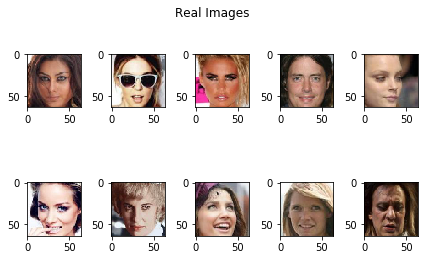

In [11]:
plt.figure(figsize=(12,10))
fig,ax=plt.subplots(2,5)
fig.suptitle("Real Images")
z=800

for i in range(2):
    for j in range(5):
            ax[i,j].imshow(date_set[z].reshape(64,64,3))
            z+=600
            
plt.tight_layout()
plt.show()

**Note** — Since the last layer activation of the generator is tanh, whose range limits (-1,1), the image pixels are normalized by dividing each pixel by 255 and then changed to bring into (-1,1) range by multiplying with 2 and subtracting 1.

In [24]:
X_train = date_set

# DCGAN Model Architecture

Using a typical CNN architecture on the discriminative model, the DCGAN architecture's core operates. Upconvolutions are used in place of convolutions in the generator, resulting in progressively larger representations at each layer as it maps from a low-dimensional latent vector onto a high-dimensional image.


1. Both the discriminator and the generator should employ batch normalization.
2. To create deeper architectures, remove all completely connected hidden layers.
3. For all layers in the generator, use ReLU activation; Tanh is used for the output.
4. For each layer, use LeakyReLU activation in the discriminator.

# Generator Design

In [25]:
noise_shape = 100

In [26]:
generator=Sequential()
generator.add(Dense(4*4*512,input_shape=[noise_shape]))
generator.add(Reshape([4,4,512]))
generator.add(Conv2DTranspose(256, kernel_size=4, strides=2, padding="same"))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(128, kernel_size=4, strides=2, padding="same"))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(64, kernel_size=4, strides=2, padding="same"))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(3, kernel_size=4, strides=2, padding="same",
                                 activation='sigmoid'))

Because I was experimenting with sigmoid and tanh to determine which produces better results, the final layer for the generator has sigmoid activation in this version. Though I also attempted a Tanh activated generator, I felt that the Sigmoid activated model made the most sense in this situation.

In [27]:
generator.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 8192)              827392    
_________________________________________________________________
reshape_2 (Reshape)          (None, 4, 4, 512)         0         
_________________________________________________________________
conv2d_transpose_5 (Conv2DTr (None, 8, 8, 256)         2097408   
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 8, 8, 256)         0         
_________________________________________________________________
batch_normalization_6 (Batch (None, 8, 8, 256)         1024      
_________________________________________________________________
conv2d_transpose_6 (Conv2DTr (None, 16, 16, 128)       524416    
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 16, 16, 128)      

# Discriminator Design

In [28]:
discriminator=Sequential()
discriminator.add(Conv2D(32, kernel_size=4, strides=2, padding="same",input_shape=[64,64, 3]))
discriminator.add(Conv2D(64, kernel_size=4, strides=2, padding="same"))
discriminator.add(LeakyReLU(0.2))
discriminator.add(BatchNormalization())
discriminator.add(Conv2D(128, kernel_size=4, strides=2, padding="same"))
discriminator.add(LeakyReLU(0.2))
discriminator.add(BatchNormalization())
discriminator.add(Conv2D(256, kernel_size=4, strides=2, padding="same"))
discriminator.add(LeakyReLU(0.2))
discriminator.add(Flatten())
discriminator.add(Dropout(0.5))
discriminator.add(Dense(1,activation='sigmoid'))

In [29]:
discriminator.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 32, 32, 32)        1568      
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 16, 16, 64)        32832     
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 16, 16, 64)        0         
_________________________________________________________________
batch_normalization_9 (Batch (None, 16, 16, 64)        256       
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 8, 8, 128)         131200    
_________________________________________________________________
leaky_re_lu_11 (LeakyReLU)   (None, 8, 8, 128)         0         
_________________________________________________________________
batch_normalization_10 (Batc (None, 8, 8, 128)        

# DCGAN Architecture (combined model of genarator and Discriminator) 

In [30]:
GAN =Sequential([generator,discriminator])

In [31]:
discriminator.compile(optimizer='adam',loss='binary_crossentropy')
discriminator.trainable = False

In [33]:
GAN.compile(optimizer='adam',loss='binary_crossentropy')
GAN.layers

In [36]:
GAN.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_1 (Sequential)    (None, 64, 64, 3)         3585219   
_________________________________________________________________
sequential_2 (Sequential)    (None, 1)                 695009    
Total params: 4,280,228
Trainable params: 3,584,323
Non-trainable params: 695,905
_________________________________________________________________


# **Training**

In [40]:
epochs = 300
batch_size = 128

D_loss=[] #list to collect loss for the discriminator model
G_loss=[] #list to collect loss for generator model

Current Epoch 1
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


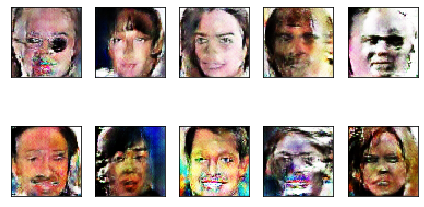

Epoch: 1,  Loss: D_real = 0.015, D_fake = 0.093,  G = 8.926
Current Epoch 2
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 2,  Loss: D_real = 0.000, D_fake = 0.056,  G = 10.472
Current Epoch 3
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 3,  Loss: D_real = 0.018, D_fake = 0.019,  G = 9.793
Current Epoch 4
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 4,  Loss: D_real = 0.001, D_fake = 0.003,  G = 10.213
Current Epoch 5
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 5,  Loss: D_real = 0.006, D_fake = 0.007,  G = 9.855
Current Epoch 6
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


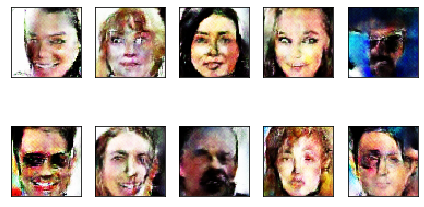

Epoch: 6,  Loss: D_real = 0.018, D_fake = 0.002,  G = 11.060
Current Epoch 7
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 7,  Loss: D_real = 0.001, D_fake = 0.019,  G = 9.783
Current Epoch 8
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 8,  Loss: D_real = 0.005, D_fake = 0.020,  G = 11.003
Current Epoch 9
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 9,  Loss: D_real = 0.037, D_fake = 0.126,  G = 8.032
Current Epoch 10
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 10,  Loss: D_real = 0.062, D_fake = 0.056,  G = 8.387
Current Epoch 11
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


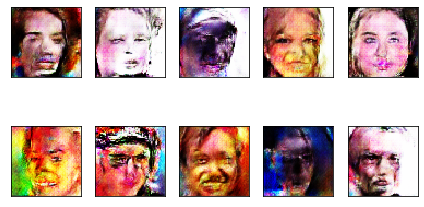

Epoch: 11,  Loss: D_real = 0.046, D_fake = 0.171,  G = 8.756
Current Epoch 12
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 12,  Loss: D_real = 0.007, D_fake = 0.010,  G = 9.770
Current Epoch 13
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 13,  Loss: D_real = 0.001, D_fake = 0.080,  G = 10.300
Current Epoch 14
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 14,  Loss: D_real = 0.056, D_fake = 0.040,  G = 9.403
Current Epoch 15
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 15,  Loss: D_real = 0.017, D_fake = 0.015,  G = 8.136
Current Epoch 16
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


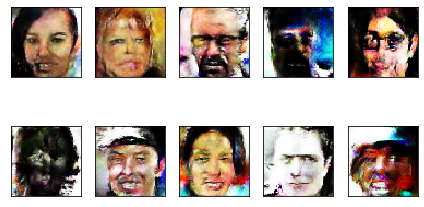

Epoch: 16,  Loss: D_real = 0.003, D_fake = 0.003,  G = 10.446
Current Epoch 17
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 17,  Loss: D_real = 0.007, D_fake = 0.028,  G = 8.900
Current Epoch 18
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 18,  Loss: D_real = 0.002, D_fake = 0.015,  G = 9.761
Current Epoch 19
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 19,  Loss: D_real = 0.031, D_fake = 0.034,  G = 8.485
Current Epoch 20
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 20,  Loss: D_real = 0.006, D_fake = 0.014,  G = 10.348
Current Epoch 21
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


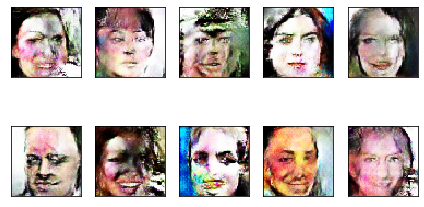

Epoch: 21,  Loss: D_real = 0.020, D_fake = 0.039,  G = 8.511
Current Epoch 22
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 22,  Loss: D_real = 0.007, D_fake = 0.036,  G = 9.966
Current Epoch 23
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 23,  Loss: D_real = 0.006, D_fake = 0.170,  G = 8.840
Current Epoch 24
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 24,  Loss: D_real = 0.050, D_fake = 0.013,  G = 9.129
Current Epoch 25
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 25,  Loss: D_real = 0.001, D_fake = 0.150,  G = 10.731
Current Epoch 26
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


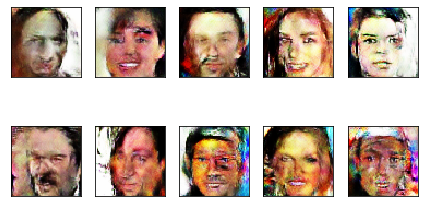

Epoch: 26,  Loss: D_real = 0.001, D_fake = 0.030,  G = 9.741
Current Epoch 27
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 27,  Loss: D_real = 0.146, D_fake = 0.184,  G = 6.913
Current Epoch 28
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 28,  Loss: D_real = 0.001, D_fake = 0.007,  G = 12.629
Current Epoch 29
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 29,  Loss: D_real = 0.038, D_fake = 0.072,  G = 7.945
Current Epoch 30
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 30,  Loss: D_real = 0.004, D_fake = 0.004,  G = 12.166
Current Epoch 31
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


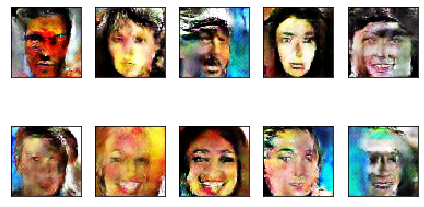

Epoch: 31,  Loss: D_real = 0.001, D_fake = 0.006,  G = 13.405
Current Epoch 32
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 32,  Loss: D_real = 0.032, D_fake = 0.116,  G = 7.821
Current Epoch 33
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 33,  Loss: D_real = 0.005, D_fake = 0.013,  G = 10.704
Current Epoch 34
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 34,  Loss: D_real = 0.002, D_fake = 0.255,  G = 8.095
Current Epoch 35
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 35,  Loss: D_real = 0.081, D_fake = 0.040,  G = 10.028
Current Epoch 36
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


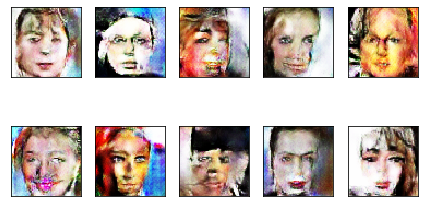

Epoch: 36,  Loss: D_real = 0.025, D_fake = 0.028,  G = 8.862
Current Epoch 37
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 37,  Loss: D_real = 0.010, D_fake = 0.010,  G = 11.121
Current Epoch 38
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 38,  Loss: D_real = 0.003, D_fake = 0.019,  G = 10.554
Current Epoch 39
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 39,  Loss: D_real = 0.000, D_fake = 0.069,  G = 8.254
Current Epoch 40
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 40,  Loss: D_real = 0.014, D_fake = 0.005,  G = 12.960
Current Epoch 41
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


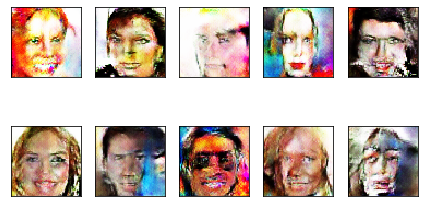

Epoch: 41,  Loss: D_real = 0.003, D_fake = 0.123,  G = 7.548
Current Epoch 42
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 42,  Loss: D_real = 0.204, D_fake = 0.031,  G = 7.581
Current Epoch 43
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 43,  Loss: D_real = 0.004, D_fake = 0.009,  G = 7.413
Current Epoch 44
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 44,  Loss: D_real = 0.106, D_fake = 0.153,  G = 7.844
Current Epoch 45
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 45,  Loss: D_real = 0.003, D_fake = 0.127,  G = 11.703
Current Epoch 46
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


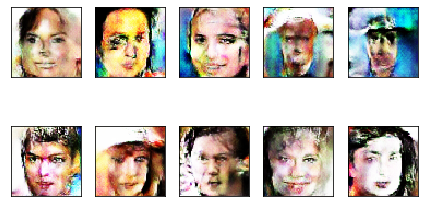

Epoch: 46,  Loss: D_real = 0.049, D_fake = 0.037,  G = 9.657
Current Epoch 47
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 47,  Loss: D_real = 0.190, D_fake = 0.059,  G = 8.775
Current Epoch 48
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 48,  Loss: D_real = 0.019, D_fake = 0.009,  G = 10.314
Current Epoch 49
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 49,  Loss: D_real = 0.009, D_fake = 0.089,  G = 10.473
Current Epoch 50
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 50,  Loss: D_real = 0.136, D_fake = 0.050,  G = 9.621
Current Epoch 51
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


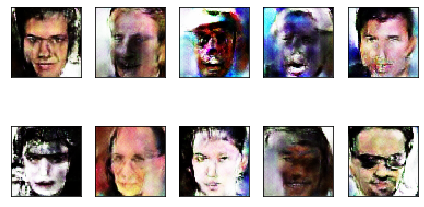

Epoch: 51,  Loss: D_real = 0.026, D_fake = 0.029,  G = 10.162
Current Epoch 52
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 52,  Loss: D_real = 0.001, D_fake = 0.001,  G = 11.673
Current Epoch 53
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 53,  Loss: D_real = 0.006, D_fake = 0.048,  G = 9.363
Current Epoch 54
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 54,  Loss: D_real = 0.000, D_fake = 0.101,  G = 10.089
Current Epoch 55
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 55,  Loss: D_real = 0.002, D_fake = 0.021,  G = 11.134
Current Epoch 56
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


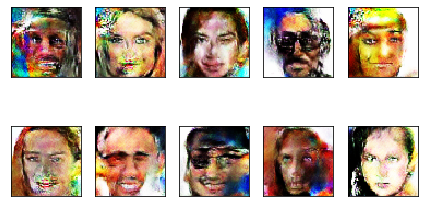

Epoch: 56,  Loss: D_real = 0.102, D_fake = 0.074,  G = 9.881
Current Epoch 57
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 57,  Loss: D_real = 0.054, D_fake = 0.089,  G = 8.541
Current Epoch 58
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 58,  Loss: D_real = 0.001, D_fake = 0.018,  G = 10.939
Current Epoch 59
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 59,  Loss: D_real = 0.003, D_fake = 0.013,  G = 9.181
Current Epoch 60
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 60,  Loss: D_real = 0.000, D_fake = 0.545,  G = 8.114
Current Epoch 61
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


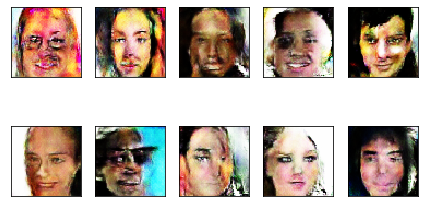

Epoch: 61,  Loss: D_real = 0.000, D_fake = 0.006,  G = 10.994
Current Epoch 62
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 62,  Loss: D_real = 0.102, D_fake = 0.016,  G = 9.227
Current Epoch 63
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 63,  Loss: D_real = 0.016, D_fake = 0.071,  G = 8.715
Current Epoch 64
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 64,  Loss: D_real = 0.257, D_fake = 0.089,  G = 8.739
Current Epoch 65
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 65,  Loss: D_real = 0.000, D_fake = 0.000,  G = 14.108
Current Epoch 66
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


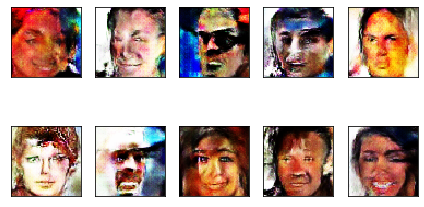

Epoch: 66,  Loss: D_real = 0.077, D_fake = 0.014,  G = 10.728
Current Epoch 67
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 67,  Loss: D_real = 0.001, D_fake = 0.060,  G = 8.780
Current Epoch 68
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 68,  Loss: D_real = 0.002, D_fake = 0.030,  G = 10.569
Current Epoch 69
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 69,  Loss: D_real = 0.001, D_fake = 0.023,  G = 10.786
Current Epoch 70
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 70,  Loss: D_real = 0.008, D_fake = 0.006,  G = 11.546
Current Epoch 71
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


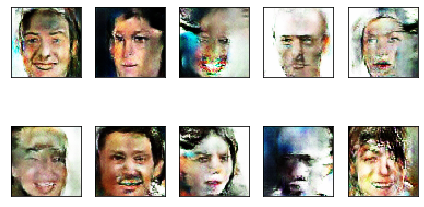

Epoch: 71,  Loss: D_real = 0.059, D_fake = 0.066,  G = 9.684
Current Epoch 72
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 72,  Loss: D_real = 0.464, D_fake = 0.000,  G = 13.989
Current Epoch 73
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 73,  Loss: D_real = 0.012, D_fake = 0.014,  G = 11.074
Current Epoch 74
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 74,  Loss: D_real = 0.005, D_fake = 0.004,  G = 10.993
Current Epoch 75
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 75,  Loss: D_real = 0.029, D_fake = 0.095,  G = 8.290
Current Epoch 76
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


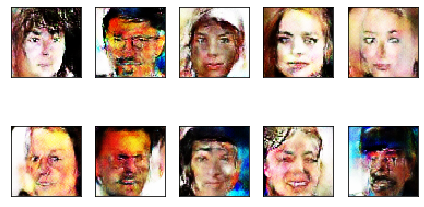

Epoch: 76,  Loss: D_real = 0.170, D_fake = 0.027,  G = 9.912
Current Epoch 77
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 77,  Loss: D_real = 0.004, D_fake = 0.003,  G = 10.674
Current Epoch 78
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 78,  Loss: D_real = 0.005, D_fake = 0.008,  G = 10.488
Current Epoch 79
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 79,  Loss: D_real = 0.105, D_fake = 0.034,  G = 10.359
Current Epoch 80
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 80,  Loss: D_real = 0.030, D_fake = 0.030,  G = 8.629
Current Epoch 81
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


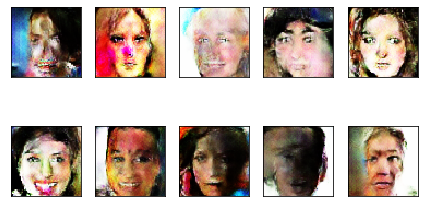

Epoch: 81,  Loss: D_real = 0.003, D_fake = 0.024,  G = 9.706
Current Epoch 82
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 82,  Loss: D_real = 0.048, D_fake = 0.006,  G = 8.997
Current Epoch 83
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 83,  Loss: D_real = 0.000, D_fake = 0.006,  G = 9.919
Current Epoch 84
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 84,  Loss: D_real = 0.049, D_fake = 0.090,  G = 7.832
Current Epoch 85
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 85,  Loss: D_real = 0.012, D_fake = 0.016,  G = 11.129
Current Epoch 86
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


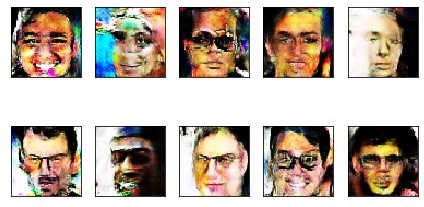

Epoch: 86,  Loss: D_real = 0.000, D_fake = 0.083,  G = 9.785
Current Epoch 87
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 87,  Loss: D_real = 0.000, D_fake = 0.004,  G = 11.983
Current Epoch 88
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 88,  Loss: D_real = 0.064, D_fake = 0.009,  G = 12.348
Current Epoch 89
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 89,  Loss: D_real = 1.332, D_fake = 0.001,  G = 7.384
Current Epoch 90
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 90,  Loss: D_real = 0.001, D_fake = 0.006,  G = 10.494
Current Epoch 91
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


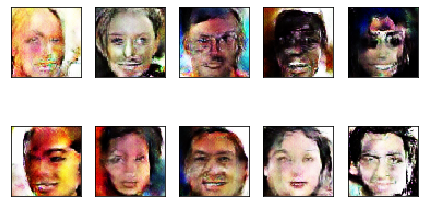

Epoch: 91,  Loss: D_real = 0.012, D_fake = 0.000,  G = 15.023
Current Epoch 92
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 92,  Loss: D_real = 0.000, D_fake = 0.013,  G = 13.109
Current Epoch 93
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 93,  Loss: D_real = 0.003, D_fake = 0.001,  G = 11.161
Current Epoch 94
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 94,  Loss: D_real = 0.005, D_fake = 0.039,  G = 9.485
Current Epoch 95
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 95,  Loss: D_real = 0.003, D_fake = 0.057,  G = 10.522
Current Epoch 96
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


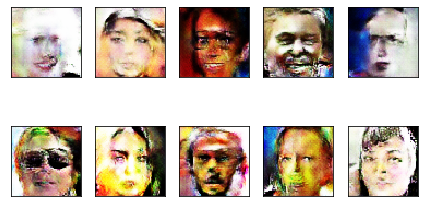

Epoch: 96,  Loss: D_real = 0.076, D_fake = 0.010,  G = 11.305
Current Epoch 97
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 97,  Loss: D_real = 0.001, D_fake = 0.005,  G = 11.239
Current Epoch 98
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 98,  Loss: D_real = 0.024, D_fake = 0.023,  G = 9.038
Current Epoch 99
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 99,  Loss: D_real = 0.002, D_fake = 0.008,  G = 9.548
Current Epoch 100
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 100,  Loss: D_real = 0.009, D_fake = 0.005,  G = 9.612
Current Epoch 101
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


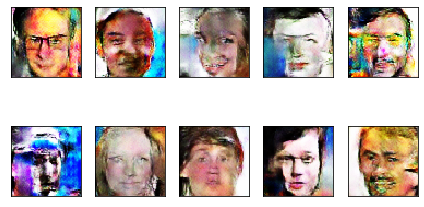

Epoch: 101,  Loss: D_real = 0.000, D_fake = 0.025,  G = 11.232
Current Epoch 102
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 102,  Loss: D_real = 0.029, D_fake = 0.009,  G = 12.241
Current Epoch 103
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 103,  Loss: D_real = 0.003, D_fake = 0.067,  G = 9.289
Current Epoch 104
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 104,  Loss: D_real = 0.011, D_fake = 0.062,  G = 9.703
Current Epoch 105
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 105,  Loss: D_real = 0.020, D_fake = 0.011,  G = 9.379
Current Epoch 106
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


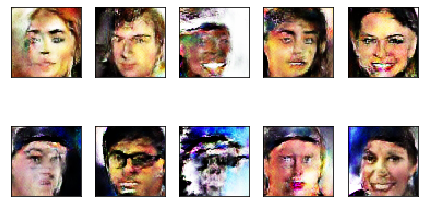

Epoch: 106,  Loss: D_real = 0.020, D_fake = 0.005,  G = 12.533
Current Epoch 107
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 107,  Loss: D_real = 0.026, D_fake = 0.026,  G = 10.071
Current Epoch 108
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 108,  Loss: D_real = 0.001, D_fake = 0.018,  G = 11.561
Current Epoch 109
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 109,  Loss: D_real = 0.003, D_fake = 0.190,  G = 11.101
Current Epoch 110
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 110,  Loss: D_real = 0.095, D_fake = 0.076,  G = 10.764
Current Epoch 111
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


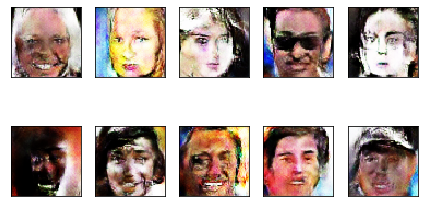

Epoch: 111,  Loss: D_real = 0.013, D_fake = 0.022,  G = 10.353
Current Epoch 112
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 112,  Loss: D_real = 0.053, D_fake = 0.012,  G = 8.429
Current Epoch 113
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 113,  Loss: D_real = 0.008, D_fake = 0.002,  G = 11.888
Current Epoch 114
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 114,  Loss: D_real = 0.004, D_fake = 0.011,  G = 9.256
Current Epoch 115
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 115,  Loss: D_real = 0.027, D_fake = 0.014,  G = 11.756
Current Epoch 116
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


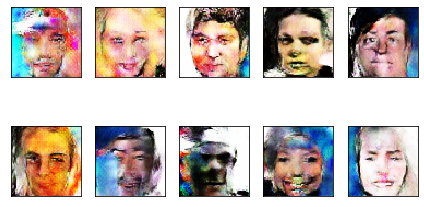

Epoch: 116,  Loss: D_real = 0.000, D_fake = 0.040,  G = 10.094
Current Epoch 117
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 117,  Loss: D_real = 0.020, D_fake = 0.077,  G = 8.922
Current Epoch 118
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 118,  Loss: D_real = 0.144, D_fake = 0.001,  G = 12.201
Current Epoch 119
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 119,  Loss: D_real = 0.013, D_fake = 0.032,  G = 10.596
Current Epoch 120
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 120,  Loss: D_real = 0.047, D_fake = 0.000,  G = 14.945
Current Epoch 121
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


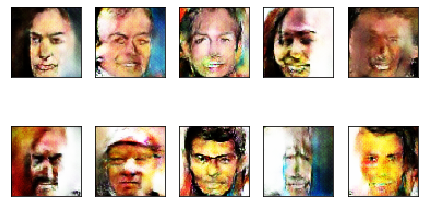

Epoch: 121,  Loss: D_real = 0.013, D_fake = 0.001,  G = 12.783
Current Epoch 122
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 122,  Loss: D_real = 0.003, D_fake = 0.091,  G = 8.495
Current Epoch 123
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 123,  Loss: D_real = 0.004, D_fake = 0.036,  G = 10.135
Current Epoch 124
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 124,  Loss: D_real = 0.000, D_fake = 0.416,  G = 8.179
Current Epoch 125
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 125,  Loss: D_real = 0.023, D_fake = 0.096,  G = 9.685
Current Epoch 126
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


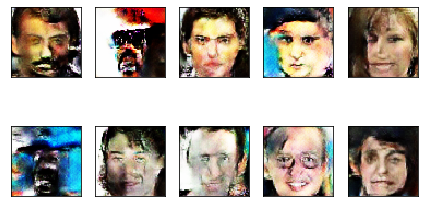

Epoch: 126,  Loss: D_real = 0.003, D_fake = 0.005,  G = 10.162
Current Epoch 127
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 127,  Loss: D_real = 0.041, D_fake = 0.097,  G = 9.497
Current Epoch 128
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 128,  Loss: D_real = 0.013, D_fake = 0.012,  G = 12.128
Current Epoch 129
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 129,  Loss: D_real = 0.007, D_fake = 0.010,  G = 8.409
Current Epoch 130
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 130,  Loss: D_real = 0.008, D_fake = 0.000,  G = 12.304
Current Epoch 131
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


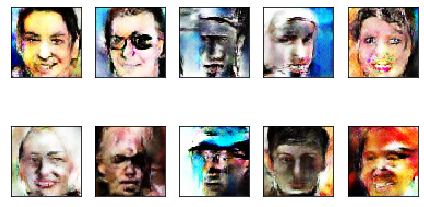

Epoch: 131,  Loss: D_real = 0.089, D_fake = 0.055,  G = 9.856
Current Epoch 132
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 132,  Loss: D_real = 0.029, D_fake = 0.022,  G = 11.639
Current Epoch 133
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 133,  Loss: D_real = 0.036, D_fake = 0.000,  G = 15.475
Current Epoch 134
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 134,  Loss: D_real = 0.010, D_fake = 0.063,  G = 9.201
Current Epoch 135
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 135,  Loss: D_real = 0.011, D_fake = 0.028,  G = 9.634
Current Epoch 136
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


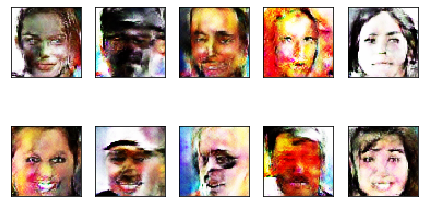

Epoch: 136,  Loss: D_real = 0.034, D_fake = 0.027,  G = 11.551
Current Epoch 137
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 137,  Loss: D_real = 0.003, D_fake = 0.032,  G = 10.196
Current Epoch 138
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 138,  Loss: D_real = 0.029, D_fake = 0.148,  G = 8.560
Current Epoch 139
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 139,  Loss: D_real = 0.005, D_fake = 0.002,  G = 11.687
Current Epoch 140
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 140,  Loss: D_real = 0.003, D_fake = 0.026,  G = 9.729
Current Epoch 141
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


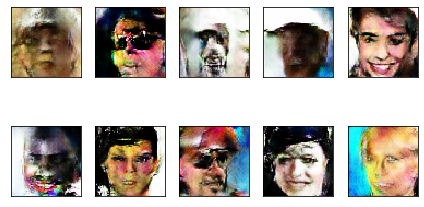

Epoch: 141,  Loss: D_real = 0.012, D_fake = 0.026,  G = 8.956
Current Epoch 142
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 142,  Loss: D_real = 0.008, D_fake = 0.016,  G = 9.099
Current Epoch 143
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 143,  Loss: D_real = 0.014, D_fake = 0.001,  G = 12.076
Current Epoch 144
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 144,  Loss: D_real = 0.078, D_fake = 0.002,  G = 14.669
Current Epoch 145
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 145,  Loss: D_real = 0.001, D_fake = 0.011,  G = 11.776
Current Epoch 146
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


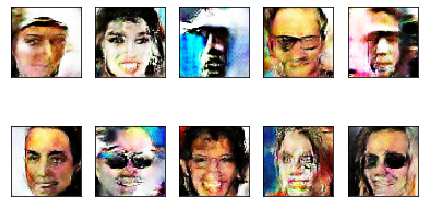

Epoch: 146,  Loss: D_real = 0.003, D_fake = 0.043,  G = 8.678
Current Epoch 147
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 147,  Loss: D_real = 0.010, D_fake = 0.223,  G = 8.683
Current Epoch 148
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 148,  Loss: D_real = 0.008, D_fake = 0.002,  G = 13.857
Current Epoch 149
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 149,  Loss: D_real = 0.004, D_fake = 0.002,  G = 14.388
Current Epoch 150
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 150,  Loss: D_real = 0.002, D_fake = 0.017,  G = 10.886
Current Epoch 151
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


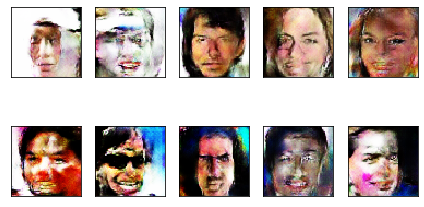

Epoch: 151,  Loss: D_real = 0.004, D_fake = 0.017,  G = 9.989
Current Epoch 152
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 152,  Loss: D_real = 0.031, D_fake = 0.025,  G = 8.533
Current Epoch 153
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 153,  Loss: D_real = 0.007, D_fake = 0.073,  G = 10.214
Current Epoch 154
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 154,  Loss: D_real = 0.082, D_fake = 0.001,  G = 12.132
Current Epoch 155
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 155,  Loss: D_real = 0.171, D_fake = 0.010,  G = 9.361
Current Epoch 156
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


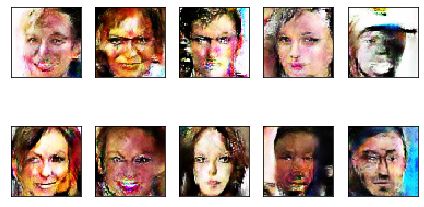

Epoch: 156,  Loss: D_real = 0.017, D_fake = 0.030,  G = 9.406
Current Epoch 157
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 157,  Loss: D_real = 0.012, D_fake = 0.044,  G = 10.274
Current Epoch 158
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 158,  Loss: D_real = 0.064, D_fake = 0.002,  G = 12.679
Current Epoch 159
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 159,  Loss: D_real = 0.010, D_fake = 0.024,  G = 10.525
Current Epoch 160
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 160,  Loss: D_real = 0.004, D_fake = 0.041,  G = 11.062
Current Epoch 161
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


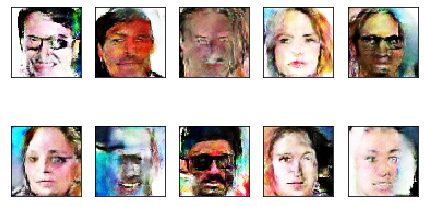

Epoch: 161,  Loss: D_real = 0.000, D_fake = 0.025,  G = 12.497
Current Epoch 162
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 162,  Loss: D_real = 0.028, D_fake = 0.022,  G = 9.933
Current Epoch 163
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 163,  Loss: D_real = 0.003, D_fake = 0.038,  G = 10.078
Current Epoch 164
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 164,  Loss: D_real = 0.004, D_fake = 0.023,  G = 8.497
Current Epoch 165
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 165,  Loss: D_real = 0.009, D_fake = 0.007,  G = 8.679
Current Epoch 166
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


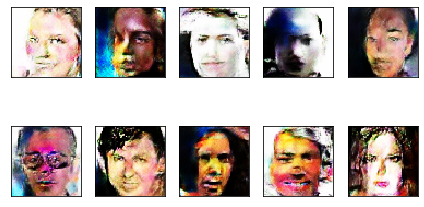

Epoch: 166,  Loss: D_real = 0.001, D_fake = 0.053,  G = 10.386
Current Epoch 167
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 167,  Loss: D_real = 0.037, D_fake = 0.001,  G = 10.314
Current Epoch 168
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 168,  Loss: D_real = 0.000, D_fake = 0.077,  G = 9.192
Current Epoch 169
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 169,  Loss: D_real = 0.004, D_fake = 0.083,  G = 9.756
Current Epoch 170
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 170,  Loss: D_real = 0.057, D_fake = 0.014,  G = 11.565
Current Epoch 171
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


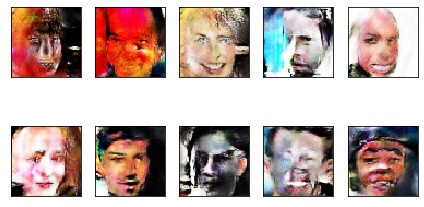

Epoch: 171,  Loss: D_real = 0.053, D_fake = 0.006,  G = 14.585
Current Epoch 172
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 172,  Loss: D_real = 0.000, D_fake = 0.039,  G = 12.952
Current Epoch 173
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 173,  Loss: D_real = 0.012, D_fake = 0.005,  G = 11.865
Current Epoch 174
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 174,  Loss: D_real = 0.028, D_fake = 0.039,  G = 12.356
Current Epoch 175
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 175,  Loss: D_real = 0.008, D_fake = 0.011,  G = 11.341
Current Epoch 176
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


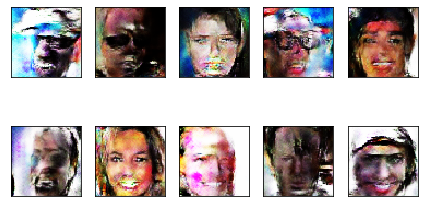

Epoch: 176,  Loss: D_real = 0.013, D_fake = 0.020,  G = 10.132
Current Epoch 177
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 177,  Loss: D_real = 0.014, D_fake = 0.093,  G = 8.940
Current Epoch 178
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 178,  Loss: D_real = 0.004, D_fake = 0.003,  G = 12.737
Current Epoch 179
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 179,  Loss: D_real = 0.001, D_fake = 0.009,  G = 10.309
Current Epoch 180
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 180,  Loss: D_real = 0.021, D_fake = 0.014,  G = 7.766
Current Epoch 181
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


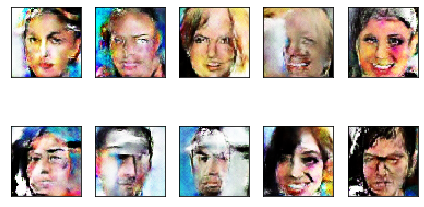

Epoch: 181,  Loss: D_real = 0.013, D_fake = 0.006,  G = 11.469
Current Epoch 182
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 182,  Loss: D_real = 0.005, D_fake = 0.013,  G = 9.107
Current Epoch 183
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 183,  Loss: D_real = 0.007, D_fake = 0.013,  G = 11.875
Current Epoch 184
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 184,  Loss: D_real = 0.012, D_fake = 0.191,  G = 8.137
Current Epoch 185
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 185,  Loss: D_real = 0.002, D_fake = 0.065,  G = 10.378
Current Epoch 186
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


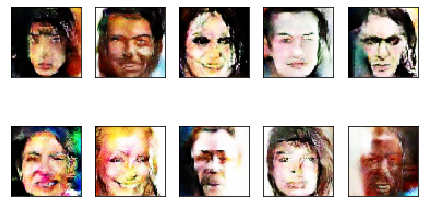

Epoch: 186,  Loss: D_real = 0.003, D_fake = 0.126,  G = 9.841
Current Epoch 187
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 187,  Loss: D_real = 0.002, D_fake = 0.000,  G = 13.814
Current Epoch 188
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 188,  Loss: D_real = 0.033, D_fake = 0.112,  G = 7.946
Current Epoch 189
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 189,  Loss: D_real = 0.007, D_fake = 0.025,  G = 12.897
Current Epoch 190
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 190,  Loss: D_real = 0.002, D_fake = 0.033,  G = 11.228
Current Epoch 191
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


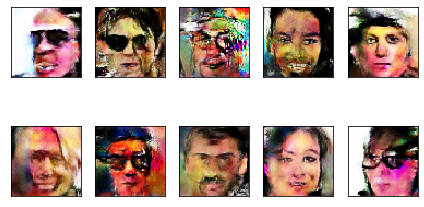

Epoch: 191,  Loss: D_real = 0.006, D_fake = 0.020,  G = 11.205
Current Epoch 192
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 192,  Loss: D_real = 0.003, D_fake = 0.024,  G = 12.079
Current Epoch 193
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 193,  Loss: D_real = 0.024, D_fake = 0.008,  G = 10.989
Current Epoch 194
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 194,  Loss: D_real = 0.003, D_fake = 0.004,  G = 12.158
Current Epoch 195
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 195,  Loss: D_real = 0.017, D_fake = 0.053,  G = 9.606
Current Epoch 196
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390


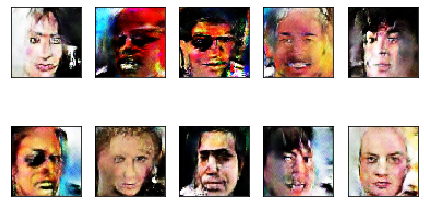

Epoch: 196,  Loss: D_real = 0.000, D_fake = 0.461,  G = 7.954
Current Epoch 197
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 197,  Loss: D_real = 0.001, D_fake = 0.057,  G = 12.128
Current Epoch 198
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 198,  Loss: D_real = 0.015, D_fake = 0.003,  G = 14.357
Current Epoch 199
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 199,  Loss: D_real = 0.019, D_fake = 0.146,  G = 9.677
Current Epoch 200
	Current batch 0 of 390
	Current batch 100 of 390
	Current batch 200 of 390
	Current batch 300 of 390
Epoch: 200,  Loss: D_real = 0.002, D_fake = 0.029,  G = 10.308
Training is complete


In [56]:
with tf.device('/gpu:0'):
 for epoch in range(epochs):
    print(f"Current Epoch {epoch+1}")
    
    # For every batch in the dataset
    for i in range(X_train.shape[0]//batch_size):
        
        if (i)%100 == 0:
            print(f"\tCurrent batch {i} of {len(X_train)//batch_size}")
            
        noise=np.random.uniform(-1,1,size=[batch_size,noise_shape])
        
        gen_image = generator.predict_on_batch(noise)
        
        train_dataset = X_train[i*batch_size:(i+1)*batch_size]
        #train on real image
        train_label=np.ones(shape=(batch_size,1))
        discriminator.trainable = True
        d_loss1 = discriminator.train_on_batch(train_dataset,train_label)
        
        #train on fake image
        train_label=np.zeros(shape=(batch_size,1))
        d_loss2 = discriminator.train_on_batch(gen_image,train_label)
        
        
        noise=np.random.uniform(-1,1,size=[batch_size,noise_shape])
        train_label=np.ones(shape=(batch_size,1))
        discriminator.trainable = False
        #train the generator
        g_loss = GAN.train_on_batch(noise, train_label)
        D_loss.append(d_loss1+d_loss2)
        G_loss.append(g_loss)
        
         
    if epoch % 5 == 0:
        samples = 10
        x_fake = generator.predict(np.random.normal(loc=0, scale=1, size=(samples,100)))

        for k in range(samples):
            plt.subplot(2, 5, k+1)
            plt.imshow(x_fake[k].reshape(64,64,3))
            plt.xticks([])
            plt.yticks([])

        
        plt.tight_layout()
        plt.show()
    print('Epoch: %d,  Loss: D_real = %.3f, D_fake = %.3f,  G = %.3f' %   (epoch+1, d_loss1, d_loss2, g_loss))        
print('Training is complete')

approx training time for 300 epochs was appx 6 hours.

# **Output Visualization**

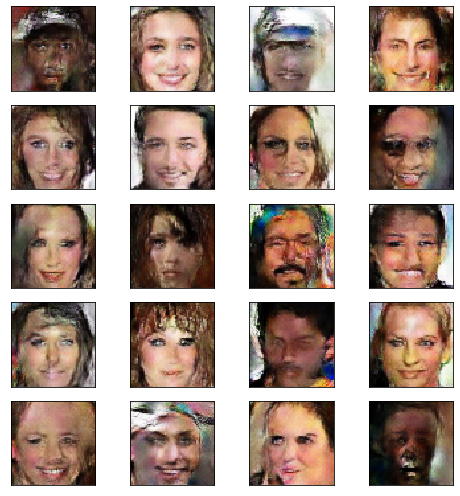

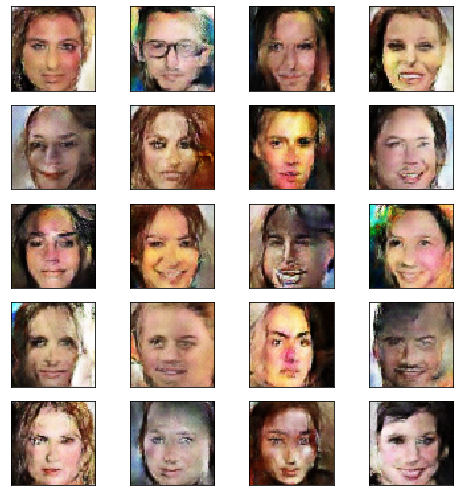

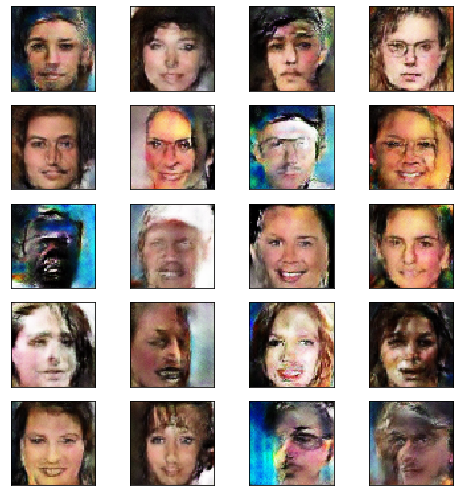

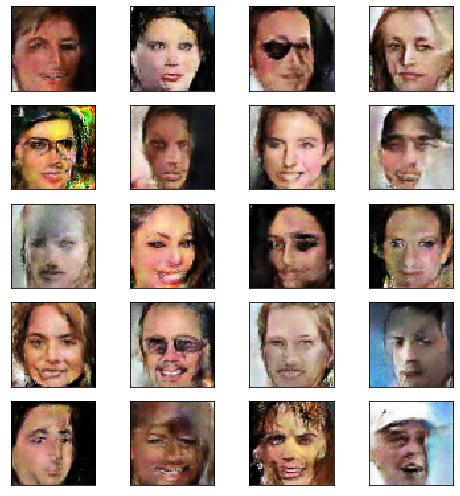

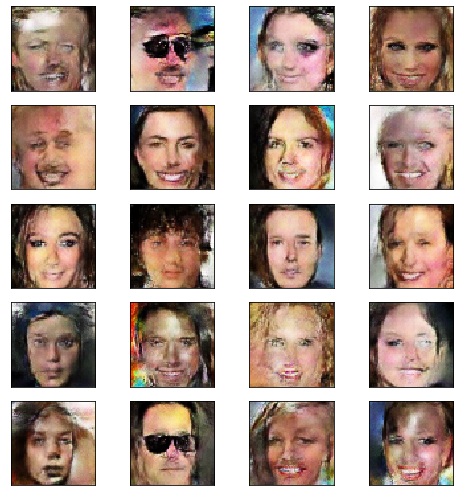

In [68]:
for i in range(5):
 plt.figure(figsize=(7,7))   
 for k in range(20):
            noise=np.random.uniform(-1,1,size=[100,noise_shape])
            im=generator.predict(noise) 
            plt.subplot(5, 4, k+1)
            plt.imshow(im[k].reshape(64,64,3))
 
 plt.tight_layout()
 plt.show()